# Dealing with Multiclass Data: Covertype Prediction

**Goal: predict cover type given the other variables (7 cover types )**

**In this project, we are asked to predict the forest cover type (the predominant kind of tree cover) from strictly cartographic variables (as opposed to remotely sensed data) based on the UCI ML Repository dataset.** The actual forest cover type for a given 30 x 30 meter cell was determined from US Forest Service (USFS) Region 2 Resource Information System data. Independent variables were then derived from data obtained from the US Geological Survey and USFS. The data is in raw form (not scaled) and contains binary columns of data for qualitative independent variables such as wilderness areas and soil type.

This study area includes four wilderness areas located in the Roosevelt National Forest of northern Colorado. These areas represent forests with minimal human-caused disturbances, so that existing forest cover types are more a result of ecological processes rather than forest management practices.

*Note that when viewing this notebook on Github without downloading it, some of the nbextensions may not work.*

**The website for the dataset can be viewed below:**

In [10]:
from IPython.display import IFrame
IFrame('https://archive.ics.uci.edu/ml/datasets/Covertype', width=900, height=450)

**And a similar Kaggle competition that describes this challenge / project question can be found below:**
https://www.kaggle.com/c/forest-cover-type-prediction/data

### Business Use Case

**Information about the dataset:**
"Predicting forest cover type from cartographic variables only (no remotely sensed data). The actual forest cover type for a given observation (30 x 30 meter cell) was determined from US Forest Service (USFS) Region 2 Resource Information System (RIS) data. Independent variables were derived from data originally obtained from US Geological Survey (USGS) and USFS data. Data is in raw form (not scaled) and contains binary (0 or 1) columns of data for qualitative independent variables (wilderness areas and soil types). 

This study area includes four wilderness areas located in the Roosevelt National Forest of northern Colorado. These areas represent forests with minimal human-caused disturbances, so that existing forest cover types are more a result of ecological processes rather than forest management practices. 

Some background information for these four wilderness areas: Neota (area 2) probably has the highest mean elevational value of the 4 wilderness areas. Rawah (area 1) and Comanche Peak (area 3) would have a lower mean elevational value, while Cache la Poudre (area 4) would have the lowest mean elevational value. 

As for primary major tree species in these areas, Neota would have spruce/fir (type 1), while Rawah and Comanche Peak would probably have lodgepole pine (type 2) as their primary species, followed by spruce/fir and aspen (type 5). Cache la Poudre would tend to have Ponderosa pine (type 3), Douglas-fir (type 6), and cottonwood/willow (type 4). 

The Rawah and Comanche Peak areas would tend to be more typical of the overall dataset than either the Neota or Cache la Poudre, due to their assortment of tree species and range of predictive variable values (elevation, etc.) Cache la Poudre would probably be more unique than the others, due to its relatively low elevation range and species composition." 

**Benefits of Successful Classification:**
- environmental conservation
- flora and fauna research 
- geologial studies 


## Exploratory Data Analysis 

### Importing Libraries + Loading Data 

In [1]:
import numpy as np 
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import cufflinks as cf

from pprint import pprint

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

from sklearn import metrics
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report,confusion_matrix

#import sklearn.cross_validation as cross_validation
#from sklearn.cross_validation import train_test_split
import sklearn.model_selection as model_selection
from sklearn import linear_model

from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydot 

import mca

from sklearn.neighbors import KNeighborsClassifier

from random import sample

In [2]:
import os
os.getcwd()

'/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Scripts'

In [3]:
os.chdir('/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Data')
os.getcwd()

'/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Data'

In [4]:
data = open("covtype.data")
data

<_io.TextIOWrapper name='covtype.data' mode='r' encoding='UTF-8'>

In [5]:
data = pd.read_csv("covtype.data", header=None)
#interesting that read csv also works on .data files! 

In [6]:
data.head()

,0,1,2,3,4,5,6,7,8,9,...,45,46,47,48,49,50,51,52,53,54
0,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,0,0,5
1,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
2,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
3,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
4,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5


In [7]:
# set column names 
cols = ['elevation', 'aspect', 'slope', 'horizontal_distance_to_hydrology', 
       'vertical_distance_to_hydrology', 'Horizontal_Distance_To_Roadways', 
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points',
       'Wilderness_Area_1', 'Wilderness_Area_2', 'Wilderness_Area_3', 'Wilderness_Area_4', 
       'Soil_Type_1',
        'Soil_Type_2',
        'Soil_Type_3',
        'Soil_Type_4',
        'Soil_Type_5',
        'Soil_Type_6',
        'Soil_Type_7',
        'Soil_Type_8',
        'Soil_Type_9',
        'Soil_Type_10',
        'Soil_Type_11',
        'Soil_Type_12',
        'Soil_Type_13',
        'Soil_Type_14',
        'Soil_Type_15',
        'Soil_Type_16',
        'Soil_Type_17',
        'Soil_Type_18',
        'Soil_Type_19',
        'Soil_Type_20',
        'Soil_Type_21',
        'Soil_Type_22',
        'Soil_Type_23',
        'Soil_Type_24',
        'Soil_Type_25',
        'Soil_Type_26',
        'Soil_Type_27',
        'Soil_Type_28',
        'Soil_Type_29',
        'Soil_Type_30',
        'Soil_Type_31',
        'Soil_Type_32',
        'Soil_Type_33',
        'Soil_Type_34',
        'Soil_Type_35',
        'Soil_Type_36',
        'Soil_Type_37',
        'Soil_Type_38',
        'Soil_Type_39',
        'Soil_Type_40', 
       'Cover_Type']
#cols

In [8]:
data.columns = cols
data.head()

,elevation,aspect,slope,horizontal_distance_to_hydrology,vertical_distance_to_hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Soil_Type_40,Cover_Type
0,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,0,0,5
1,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
2,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
3,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
4,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5


### Check Data Types 

In [14]:
# check data types 
data.dtypes

elevation                             int64
aspect                                int64
slope                                 int64
horizontal_distance_to_hydrology      int64
vertical_distance_to_hydrology        int64
Horizontal_Distance_To_Roadways       int64
Hillshade_9am                         int64
Hillshade_Noon                        int64
Hillshade_3pm                         int64
Horizontal_Distance_To_Fire_Points    int64
Wilderness_Area_1                     int64
Wilderness_Area_2                     int64
Wilderness_Area_3                     int64
Wilderness_Area_4                     int64
Soil_Type_1                           int64
Soil_Type_2                           int64
Soil_Type_3                           int64
Soil_Type_4                           int64
Soil_Type_5                           int64
Soil_Type_6                           int64
Soil_Type_7                           int64
Soil_Type_8                           int64
Soil_Type_9                     

In [26]:
data.info()
# no null values 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 581012 entries, 0 to 581011
Data columns (total 55 columns):
elevation                             581012 non-null int64
aspect                                581012 non-null int64
slope                                 581012 non-null int64
horizontal_distance_to_hydrology      581012 non-null int64
vertical_distance_to_hydrology        581012 non-null int64
Horizontal_Distance_To_Roadways       581012 non-null int64
Hillshade_9am                         581012 non-null int64
Hillshade_Noon                        581012 non-null int64
Hillshade_3pm                         581012 non-null int64
Horizontal_Distance_To_Fire_Points    581012 non-null int64
Wilderness_Area_1                     581012 non-null int64
Wilderness_Area_2                     581012 non-null int64
Wilderness_Area_3                     581012 non-null int64
Wilderness_Area_4                     581012 non-null int64
Soil_Type_1                           581012 non-

We can see that the data is very clean, which is in line to how it was described on the website. We also see that we're dealing with a pretty large dataset, so it's highly likely that we'll need to take a sample from the **581,012** entries.

In [54]:
data.shape

(581012, 55)

We also know that we have **55 columns / features**, which will be explored more throughly in the next section

### Covertype Descriptions and Variables

In [56]:
data.groupby('Cover_Type').size()

Cover_Type
1    211840
2    283301
3     35754
4      2747
5      9493
6     17367
7     20510
dtype: int64

We can see that the bulk of the dataset is comprised of covertype 1 and covertype 2. This gives us an idea that we could possibly use a classification model that separates Covertype 1 and 2, and "other covertypes" really well, and then another classification model that does well in separating covertypes 3, 4, 5, 6, and 7. 

In [16]:
data['Cover_Type'].describe()

count    581012.000000
mean          2.051471
std           1.396504
min           1.000000
25%           1.000000
50%           2.000000
75%           2.000000
max           7.000000
Name: Cover_Type, dtype: float64

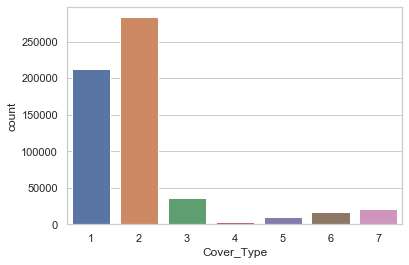

In [17]:
sns.set(style="whitegrid")
#ax = sns.barplot(x="Cover_Type", y ="Count", data=data['Cover_Type'])
sns.countplot(data['Cover_Type'])

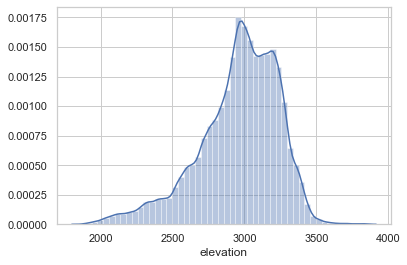

In [18]:
sns.distplot(data['elevation'])
#measured in meters

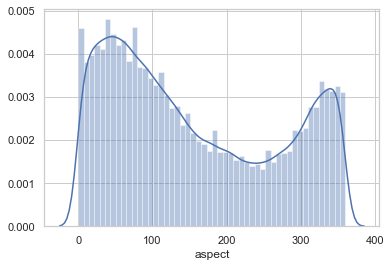

In [19]:
sns.distplot(data['aspect'])
#measured in azimuth

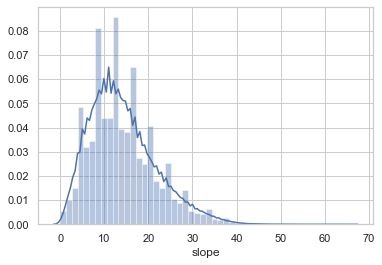

In [20]:
sns.distplot(data['slope'])
#measured in degrees

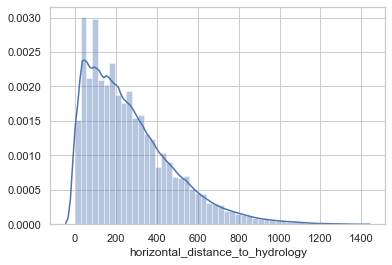

In [21]:
sns.distplot(data['horizontal_distance_to_hydrology'])
#meters

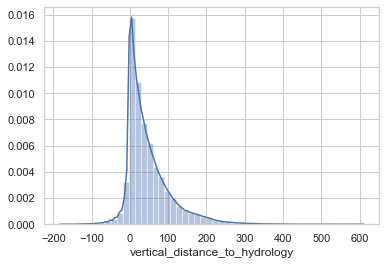

In [24]:
sns.distplot(data['vertical_distance_to_hydrology'])
#meters
#what is a negative vertical distance?
#whyy are sns charts so small

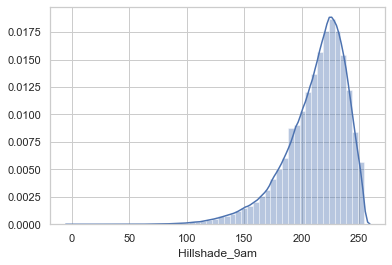

In [25]:
sns.distplot(data['Hillshade_9am'])
#index from 0-255

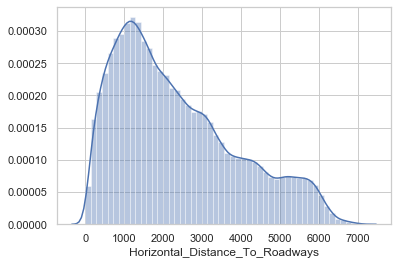

In [23]:
sns.distplot(data['Horizontal_Distance_To_Roadways'])
#meters

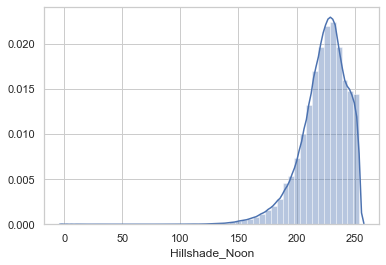

In [27]:
sns.distplot(data['Hillshade_Noon'])

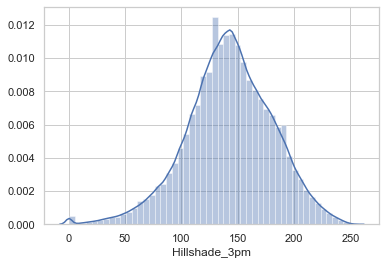

In [28]:
sns.distplot(data['Hillshade_3pm'])

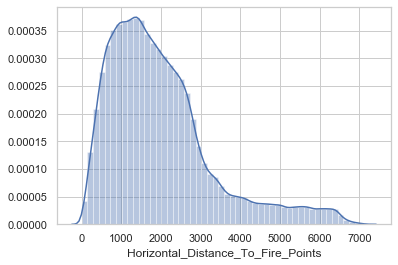

In [29]:
sns.distplot(data['Horizontal_Distance_To_Fire_Points'])
#meters

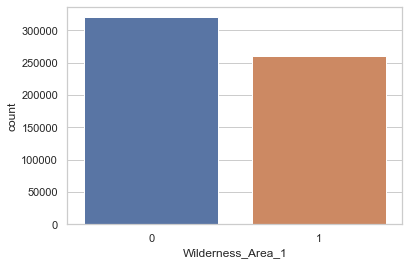

In [31]:
sns.countplot(data['Wilderness_Area_1'])

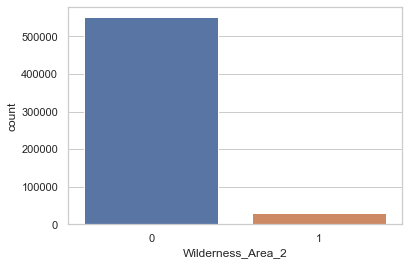

In [32]:
sns.countplot(data['Wilderness_Area_2'])

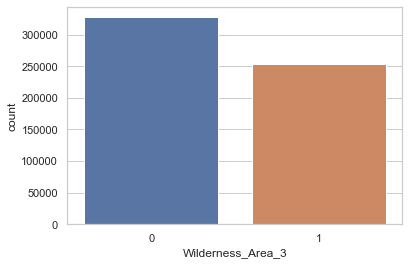

In [33]:
sns.countplot(data['Wilderness_Area_3'])

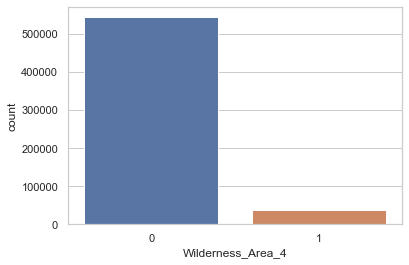

In [34]:
sns.countplot(data['Wilderness_Area_4'])

In [36]:
data.describe()

,elevation,aspect,slope,horizontal_distance_to_hydrology,vertical_distance_to_hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Soil_Type_40,Cover_Type
count,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,...,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000
mean,2959.365301,155.656807,14.103704,269.428217,46.418855,2350.146611,212.146049,223.318716,142.528263,1980.291226,...,0.090392,0.077716,0.002773,0.003255,0.000205,0.000513,0.026803,0.023762,0.015060,2.051471
std,279.984734,111.913721,7.488242,212.549356,58.295232,1559.254870,26.769889,19.768697,38.274529,1324.195210,...,0.286743,0.267725,0.052584,0.056957,0.014310,0.022641,0.161508,0.152307,0.121791,1.396504
min,1859.000000,0.000000,0.000000,0.000000,-173.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2809.000000,58.000000,9.000000,108.000000,7.000000,1106.000000,198.000000,213.000000,119.000000,1024.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,2996.000000,127.000000,13.000000,218.000000,30.000000,1997.000000,218.000000,226.000000,143.000000,1710.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,3163.000000,260.000000,18.000000,384.000000,69.000000,3328.000000,231.000000,237.000000,168.000000,2550.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
max,3858.000000,360.000000,66.000000,1397.000000,601.000000,7117.000000,254.000000,254.000000,254.000000,7173.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


### EDA by Covertype

In [38]:
#plotting multiple binary categorical variables?
data.groupby('Cover_Type').describe()

elevation                                                    \
               count         mean         std     min      25%     50%   
Cover_Type                                                               
1           211840.0  3128.644888  157.805543  2466.0  3033.00  3146.0   
2           283301.0  2920.936061  186.579366  2142.0  2794.00  2935.0   
3            35754.0  2394.509845  196.732427  1859.0  2260.25  2404.0   
4             2747.0  2223.939934  102.524587  1988.0  2142.00  2231.0   
5             9493.0  2787.417571   96.594047  2482.0  2732.00  2796.0   
6            17367.0  2419.181897  188.762292  1863.0  2320.00  2428.0   
7            20510.0  3361.928669  106.915301  2868.0  3299.25  3363.0   

                              aspect              ... Soil_Type_39       \
               75%     max     count        mean  ...          75%  max   
Cover_Type                                        ...                     
1           3235.0  3686.0  211840.0  156.138227  ...          0.0  1.0   
2           3042.0  3433.0  283301.0  152.060515  ...          0.0  1.0   
3           2549.0  2899.0   35754.0  176.372490  ...          0.0  0.0   
4           2304.0  2526.0    2747.0  137.139425  ...          0.0  0.0   
5           2857.0  3011.0    9493.0  139.283051  ...          0.0  0.0   
6           2544.0  2900.0   17367.0  180.539068  ...          0.0  0.0   
7           3409.0  3858.0   20510.0  153.236226  ...          1.0  1.0   

           Soil_Type_40                                               
                  count      mean       std  min  25%  50%  75%  max  
Cover_Type                                                            
1              211840.0  0.022781  0.149206  0.0  0.0  0.0  0.0  1.0  
2              283301.0  0.001172  0.034213  0.0  0.0  0.0  0.0  1.0  
3               35754.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
4                2747.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
5                9493.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
6               17367.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
7               20510.0  0.175134  0.380091  0.0  0.0  0.0  0.0  1.0  

[7 rows x 432 columns]

**Correlation Matrix** to identify which variables are related to covertype.

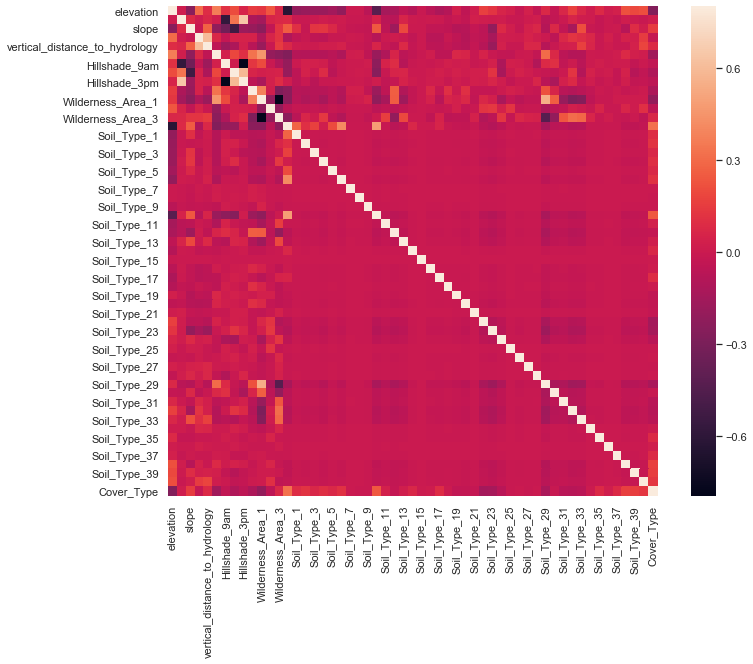

In [37]:
#correlation matrix
corrmat = data.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);
#elevation seems important

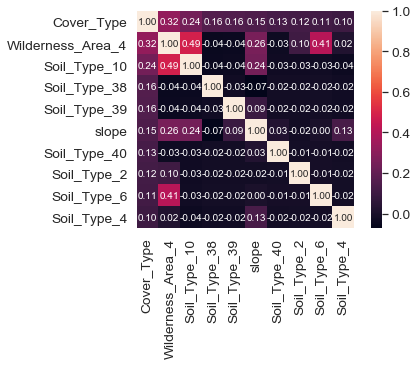

In [39]:
#numbered/labeled corr matrix, to see var importance 
k = 10 #number of variables for heatmap
cols = corrmat.nlargest(k, 'Cover_Type')['Cover_Type'].index
cm = np.corrcoef(data[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

Based on the correlation matrices above, it seems like the variables that are related to covertype are slope and elevation, as well as aspect. Let's take a deeper look by using a **scatterplot**.

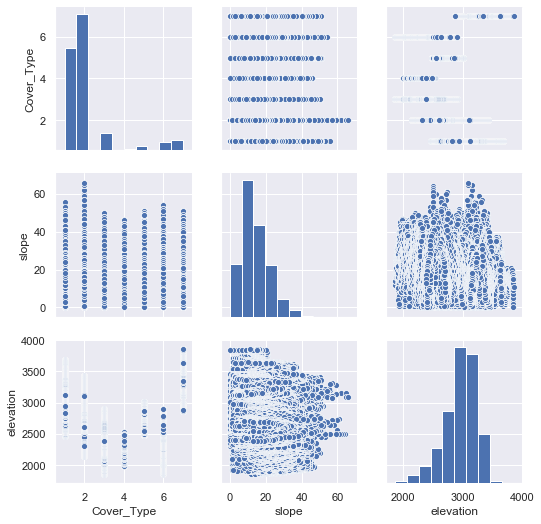

In [40]:
#scatterplot between cover type, slope and elevation
sns.set()
cols2 = ['Cover_Type', 'slope', 'elevation']
sns.pairplot(data[cols2], size = 2.5)
plt.show();

#not 100% sure how to read this to be honest

Next, to better understand variable distributions, we'll be using **histograms**. 

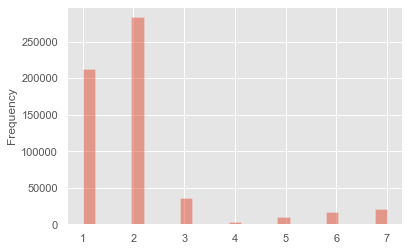

In [41]:
plt.style.use('ggplot')
data['Cover_Type'].plot.hist(alpha=0.5,bins=25)

We can also use a **cluster map** to understand the hierarchies of the variables, and how they branch out. 

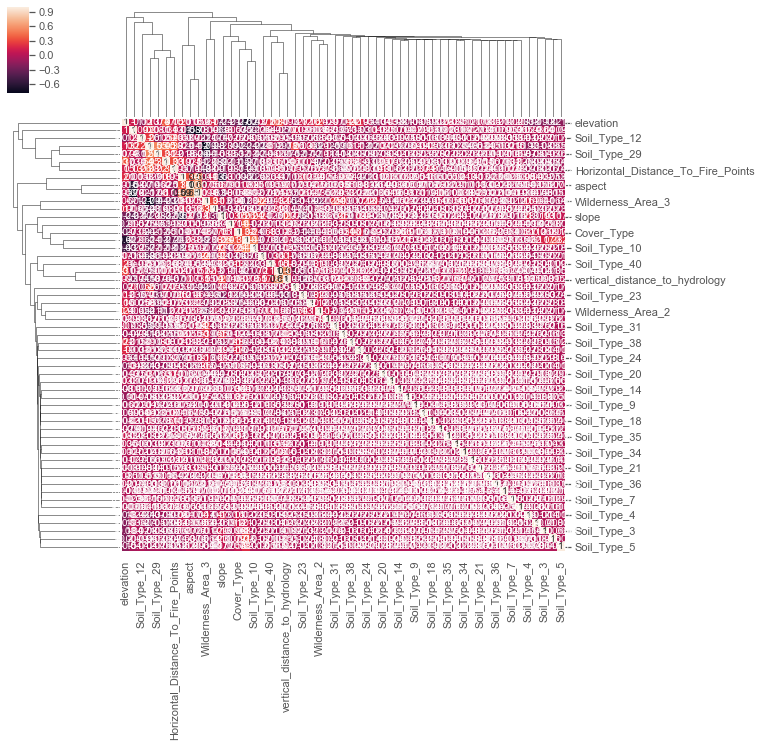

In [42]:
sns.clustermap(data.corr(),annot=True)

Elevation seems like an interesting variable to analyze. We can study how elevations are spread out across the 7 covertypes using an **lmplot**. 

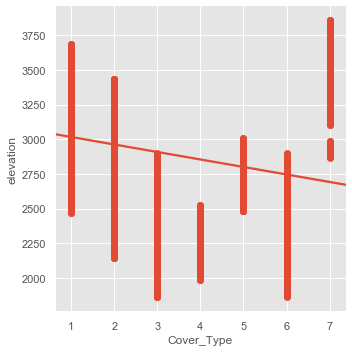

In [43]:
sns.lmplot(x='Cover_Type',y='elevation',data=data)

Next, I want to see how the data is distributed across the 7 covertypes. We can do this by using the **describe** and **groupby** functions.

In [44]:
#average elevation per cover type
avg_elevation = data["elevation"].mean()
#avg_elevation
#sns.boxplot(x=avg_elevation, y="Cover_Type", data=data,palette='rainbow')
data["elevation"].groupby(data['Cover_Type']).mean()

Cover_Type
1    3128.644888
2    2920.936061
3    2394.509845
4    2223.939934
5    2787.417571
6    2419.181897
7    3361.928669
Name: elevation, dtype: float64

In [45]:
#Average slope per covertype
data["slope"].groupby(data['Cover_Type']).mean()

Cover_Type
1    13.127110
2    13.550499
3    20.770208
4    18.528941
5    16.641315
6    19.048886
7    14.255924
Name: slope, dtype: float64

In [46]:
#average aspect per covertype
data["aspect"].groupby(data['Cover_Type']).mean()

Cover_Type
1    156.138227
2    152.060515
3    176.372490
4    137.139425
5    139.283051
6    180.539068
7    153.236226
Name: aspect, dtype: float64

In [47]:
#horizontal distance to hydrology
data["horizontal_distance_to_hydrology"].groupby(data['Cover_Type']).mean()

Cover_Type
1    270.555245
2    279.916442
3    210.276473
4    106.934838
5    212.354893
6    159.853458
7    356.994686
Name: horizontal_distance_to_hydrology, dtype: float64

In [48]:
#vertical_distance_to_hydrology
data["vertical_distance_to_hydrology"].groupby(data['Cover_Type']).mean()

Cover_Type
1    42.156939
2    45.884219
3    62.446915
4    41.186749
5    50.610344
6    45.437439
7    69.474305
Name: vertical_distance_to_hydrology, dtype: float64

**Let's look at some scatterplots to better visualize any overlaps among the different covertypes.** --> to do

## What is a good baseline model performance on this dataset?

Based on the data exploration we showed earlier, we can see that the target variable is multi-class and binary. To handle multi-class binary target variables, classification algorithms are very useful.

Some of these approaches are described in the paper here (https://www.cs.utah.edu/~piyush/teaching/aly05multiclass.pdf) as well as on the Wiki page below: 

In [11]:
IFrame('https://en.wikipedia.org/wiki/Multiclass_classification', width=900, height=450)

To set a baseline model for performance, we will use **multiclass logistic regression**. 

Also called multinomial logistic regression, softmax regression, multinomial logit (mlogit), the maximum entropy (MaxEnt) classifier, and the conditional maximum entropy model, multiclass logistic regression is "a classification method that generalizes logistic regression to multiclass problems". **This means that we can use this model for predicting the probabilities of the different outcomes of a categorical target variable,** like our covertype variable.

**Below are some useful links related to multiclass logistic regression:** 
- Wikipedia https://en.wikipedia.org/wiki/Multinomial_logistic_regression
- Andrew Ng's ML Course lecture https://www.youtube.com/watch?v=-EIfb6vFJzc

The image below from Andrew Ng's ML course shows the difference between binary classifcation and multi-class classifcation. 

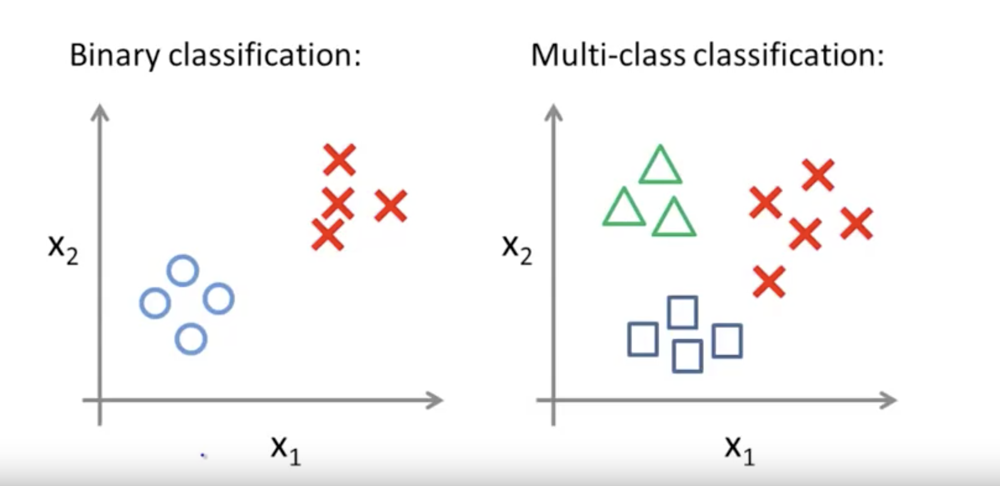

In [105]:
from IPython.display import Image
Image(filename='/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Scripts/multiclass.png', width=900, height=450) 

However, before we can go about training a multiclass logistic regression model, we need to sample the data first. Not only will it be time consuming to train a model on all 500,000+ of our entries, it is also very inefficient. 

For our particular dataset, we'll begin with a simple randomized sampling method, where we ensure a balanced class distribution. This means that we want to take a sample of n entries from each covertype from 1 to 7, and ensure that we have the same number of entries per class. 

We'll start with n = 1000. 

Although this sampling method will help us get a glimpse into the baseline model performance we can expect given the dataset, note that there are various ways to take samples from a population, as seen in the link below.

In [13]:
from IPython.display import IFrame
IFrame('https://en.wikipedia.org/wiki/Sampling_(statistics)', width=900, height=450)

###  Balanced Random Sampling
**Manual Sampling and One Hot Encoding**

In [12]:
#create dummy variables for multiclass predictor
cov_dummy = pd.get_dummies(data['Cover_Type'])
cov_dummy.head()

,1,2,3,4,5,6,7
0,0,0,0,0,1,0,0
1,0,0,0,0,1,0,0
2,0,1,0,0,0,0,0
3,0,1,0,0,0,0,0
4,0,0,0,0,1,0,0


In [13]:
df4 = pd.concat([cov_dummy, data], axis = 1)
df4.head()

,1,2,3,4,5,6,7,elevation,aspect,slope,...,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Soil_Type_40,Cover_Type
0,0,0,0,0,1,0,0,2596,51,3,...,0,0,0,0,0,0,0,0,0,5
1,0,0,0,0,1,0,0,2590,56,2,...,0,0,0,0,0,0,0,0,0,5
2,0,1,0,0,0,0,0,2804,139,9,...,0,0,0,0,0,0,0,0,0,2
3,0,1,0,0,0,0,0,2785,155,18,...,0,0,0,0,0,0,0,0,0,2
4,0,0,0,0,1,0,0,2595,45,2,...,0,0,0,0,0,0,0,0,0,5


In [14]:
from sklearn import preprocessing
import numpy as np


In [15]:
df4_column_names = list(df4.columns)
df4_column_names.remove('Cover_Type')
#df4_column_names

**Normalize the data before sampling, to ensure that the model is less sensitive to the scale of features, and to better solve for coefficients. (https://medium.com/@rrfd/standardize-or-normalize-examples-in-python-e3f174b65dfc)**

In [16]:
# Normalize all columns

x = df4.loc[:, df4.columns != 'Cover_Type'].values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df_normalized = pd.DataFrame(data=x_scaled, columns=df4_column_names)
#df_normalized.loc[:,:] = x_scaled

#from sklearn.preprocessing import MinMaxScaler

#scaler = MinMaxScaler() 
#scaled_values = scaler.fit_transform(df) 
#df.loc[:,:] = scaled_values
#x_array = np.array(df['total_bedrooms'])
#normalized_X = preprocessing.normalize([x_array])

In [17]:
df_normalized.head()

,1,2,3,4,5,6,7,elevation,aspect,slope,...,Soil_Type_31,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Soil_Type_40
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.368684,0.141667,0.045455,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.365683,0.155556,0.030303,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.472736,0.386111,0.136364,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.463232,0.430556,0.272727,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.368184,0.125000,0.030303,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
#append Y axis babck to this 
df_normalized_w_target = pd.concat([df_normalized, df4['Cover_Type']], axis=1)
df_normalized_w_target.head()

,1,2,3,4,5,6,7,elevation,aspect,slope,...,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Soil_Type_40,Cover_Type
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.368684,0.141667,0.045455,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.365683,0.155556,0.030303,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.472736,0.386111,0.136364,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.463232,0.430556,0.272727,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.368184,0.125000,0.030303,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5


In [19]:
df_normalized_w_target.shape

(581012, 62)

**From here, we can now take a random sample using the make_imbalance function**.

In [20]:
df_dummy = df_normalized_w_target
df_dummy = df_dummy.drop(['Cover_Type'], axis=1)
df_dummy.head()

,1,2,3,4,5,6,7,elevation,aspect,slope,...,Soil_Type_31,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Soil_Type_40
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.368684,0.141667,0.045455,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.365683,0.155556,0.030303,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.472736,0.386111,0.136364,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.463232,0.430556,0.272727,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.368184,0.125000,0.030303,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [21]:
from collections import Counter


from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split

from imblearn.datasets import make_imbalance
from imblearn.under_sampling import NearMiss
from imblearn.pipeline import make_pipeline
from imblearn.metrics import classification_report_imbalanced

print(__doc__)

Using TensorFlow backend.


Automatically created module for IPython interactive environment


In [22]:
RANDOM_STATE = 42

**Before doing sampling, though, we need to ensure that we're splitting the data into the target values and the features.**

In [23]:
# set target data  and x values
X=df_normalized_w_target[list(df_normalized_w_target.columns)[7:-1]]
print(X.shape)
X.head()

(581012, 54)


,elevation,aspect,slope,horizontal_distance_to_hydrology,vertical_distance_to_hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type_31,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Soil_Type_40
0,0.368684,0.141667,0.045455,0.184681,0.223514,0.071659,0.870079,0.913386,0.582677,0.875366,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.365683,0.155556,0.030303,0.151754,0.215762,0.054798,0.866142,0.925197,0.594488,0.867838,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.472736,0.386111,0.136364,0.191840,0.307494,0.446817,0.921260,0.937008,0.531496,0.853339,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.463232,0.430556,0.272727,0.173228,0.375969,0.434172,0.937008,0.937008,0.480315,0.865886,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.368184,0.125000,0.030303,0.109520,0.222222,0.054939,0.866142,0.921260,0.590551,0.860449,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [24]:
Y=df_normalized_w_target[list(df_normalized_w_target.columns)[-1]]
print(Y.shape)
Y.head()
#Y

(581012,)


0    5
1    5
2    2
3    2
4    5
Name: Cover_Type, dtype: int64

In [25]:
#ensure that we have all the classes
df_normalized_w_target.Cover_Type.unique()

array([5, 2, 1, 7, 3, 6, 4])

In [28]:
df_normalized_w_target.groupby('Cover_Type').describe()

1                                            2       ...  \
               count mean  std  min  25%  50%  75%  max     count mean  ...   
Cover_Type                                                              ...   
1           211840.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  211840.0  0.0  ...   
2           283301.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  283301.0  1.0  ...   
3            35754.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   35754.0  0.0  ...   
4             2747.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0    2747.0  0.0  ...   
5             9493.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0    9493.0  0.0  ...   
6            17367.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   17367.0  0.0  ...   
7            20510.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   20510.0  0.0  ...   

           Soil_Type_39      Soil_Type_40                                     \
                    75%  max        count      mean       std  min  25%  50%   
Cover_Type                                                                     
1                   0.0  1.0     211840.0  0.022781  0.149206  0.0  0.0  0.0   
2                   0.0  1.0     283301.0  0.001172  0.034213  0.0  0.0  0.0   
3                   0.0  0.0      35754.0  0.000000  0.000000  0.0  0.0  0.0   
4                   0.0  0.0       2747.0  0.000000  0.000000  0.0  0.0  0.0   
5                   0.0  0.0       9493.0  0.000000  0.000000  0.0  0.0  0.0   
6                   0.0  0.0      17367.0  0.000000  0.000000  0.0  0.0  0.0   
7                   1.0  1.0      20510.0  0.175134  0.380091  0.0  0.0  0.0   

                      
            75%  max  
Cover_Type            
1           0.0  1.0  
2           0.0  1.0  
3           0.0  0.0  
4           0.0  0.0  
5           0.0  0.0  
6           0.0  0.0  
7           0.0  1.0  

[7 rows x 488 columns]

**Finally, sample the data.**

In [26]:
#sample the data, 1000 per output
X, y = make_imbalance(X, Y,
                      sampling_strategy={1: 1000, 2: 1000, 3: 1000, 4:1000, 5:1000, 6:1000, 7:1000},
                      random_state=RANDOM_STATE)

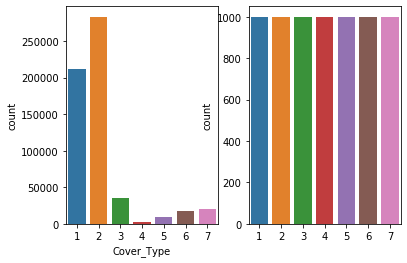

In [30]:
#compare the distribution of the target var with the new sample
fig, ax =plt.subplots(1,2)
sns.countplot(df_normalized_w_target['Cover_Type'], ax=ax[0])
#sns.countplot(df['batting'], ax=ax[0])
sns.countplot((y), ax=ax[1])
#sns.countplot(df['bowling'], ax=ax[1])
fig.show()


**Then, to fit our new sample data into a multiclass logistic regression, we need to first split the sample data into training and testing sets. We'll go with the 70% training, 30% testing split using scikit learn.**

In [27]:
#split into training and testing
X_train, X_test, y_train, y_test = train_test_split(
    X, y, random_state=RANDOM_STATE)

In [32]:
print('Training target statistics: {}'.format(Counter(y_train)))
print('Testing target statistics: {}'.format(Counter(y_test)))

Training target statistics: Counter({3: 767, 5: 766, 7: 764, 6: 752, 1: 738, 4: 733, 2: 730})
Testing target statistics: Counter({2: 270, 4: 267, 1: 262, 6: 248, 7: 236, 5: 234, 3: 233})


In [28]:
from sklearn.svm import SVC
from sklearn.datasets import make_classification

from yellowbrick.features import RFECV

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold


### Implement Logistic Regression

In [34]:
from sklearn.linear_model import LogisticRegression

In [35]:
logreg = LogisticRegression(random_state=42, solver='lbfgs', multi_class='multinomial')

In [36]:
logreg = LogisticRegression(random_state=42, solver='lbfgs', multi_class='multinomial').fit(X_train, y_train)
logreg

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

### Evaluate Model Performance

Next, we need to determine which metrics are the most useful for evaluating this baseline model. Using accuracy and the confusion matrix are a good start for measuring model performance. 

"Accuracy refers to the closeness of a measured value to a standard or known value." (https://labwrite.ncsu.edu/Experimental%20Design/accuracyprecision.htm) "Precision refers to the closeness of two or more measurements to each other."

The formula for accuracy is:

**Accuracy = TP + TN / TP + TN + FP + FN**

"In simplest terms, given a set of data points from repeated measurements of the same quantity, the set can be said to be precise if the values are close to each other, while the set can be said to be accurate if their average is close to the true value of the quantity being measured."

A confusion matrix is "a table that is often used to describe the performance of a classification model (or "classifier") on a set of test data for which the true values are known." (https://www.dataschool.io/simple-guide-to-confusion-matrix-terminology/) It shows the predicted versus actual classes. 

Other helpful links for accuracy, precision, and confusion matrices can be found below: 
- Wikipedia definition https://en.wikipedia.org/wiki/Accuracy_and_precision 
- Formula for accuracy and precision https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4614595/
- Confusion matrix definition https://en.wikipedia.org/wiki/Confusion_matrix
- Simple guide to confusion matrix https://www.dataschool.io/simple-guide-to-confusion-matrix-terminology/


Some other model performance metrics can be seen in the link below. 

In [29]:
from IPython.display import IFrame
IFrame('https://www.analyticsvidhya.com/blog/2016/02/7-important-model-evaluation-error-metrics/', width = 900, height = 450)

In [38]:
from sklearn import metrics
#this is for all the variables
print ("Multinomial Logistic regression Train Accuracy:", metrics.accuracy_score(y_train, logreg.predict(X_train)))
print ("Multinomial Logistic regression Test Accuracy:", metrics.accuracy_score(y_test, logreg.predict(X_test)))

Multinomial Logistic regression Train Accuracy: 0.6699047619047619
Multinomial Logistic regression Test Accuracy: 0.6691428571428572


In [39]:
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.67


In [40]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.60      0.71      0.65       262
           2       0.62      0.40      0.49       270
           3       0.57      0.55      0.56       233
           4       0.81      0.89      0.85       267
           5       0.60      0.74      0.66       234
           6       0.60      0.58      0.59       248
           7       0.89      0.82      0.85       236

    accuracy                           0.67      1750
   macro avg       0.67      0.67      0.66      1750
weighted avg       0.67      0.67      0.66      1750



In [41]:
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_test, y_pred)
print(conf_mat)

[[185  35   0   0  21   0  21]
 [ 74 109   3   0  67  14   3]
 [  0   1 128  33  12  59   0]
 [  0   0  19 237   0  11   0]
 [  8  28  12   0 174  12   0]
 [  0   4  62  21  17 144   0]
 [ 41   0   0   0   1   0 194]]


**Using Multi-Class Logistic Regression and including all 54 variables, we get an accuracy rate of about 67%.**

## What models do we expect to give the best performance?

We know that our dataset has multiclass target variables. So, we'd expect supervised classification models to perform better on this. Granted, we simplified our sampling method to show balanced classes, which could potentially create some bias in our model. However, an important part in creating a useful model is understanding whether the question requires a classification or regression model. 

"The main difference between them is that the output variable in regression is numerical (or continuous) while that for classification is categorical (or discrete)." Moreover, "classification algorithms attempt to estimate the mapping function (f) from the input variables (x) to discrete or categorical output variables (y)." (https://medium.com/quick-code/regression-versus-classification-machine-learning-whats-the-difference-345c56dd15f7) 

For the purposes of this project, the supervised classification models we'll be testing are: 
- SVM 
- decision tree
- random forest
- kNN model and 
- XGBoost model

Helpful Links for Supervised Classification Models:
- https://www.sciencedirect.com/topics/earth-and-planetary-sciences/supervised-classification
- https://medium.com/quick-code/regression-versus-classification-machine-learning-whats-the-difference-345c56dd15f7

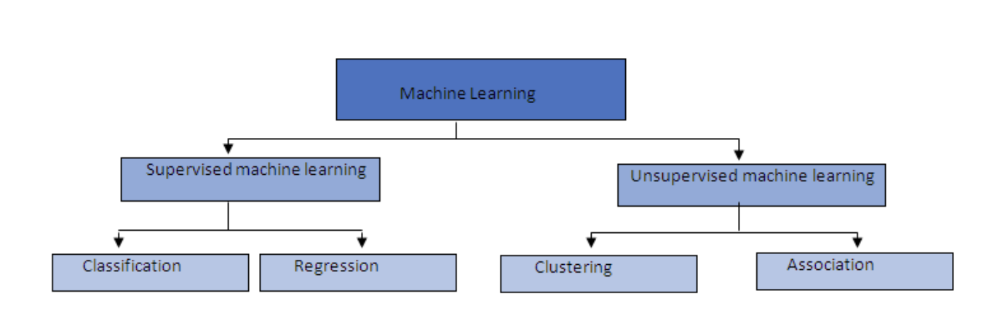

In [143]:
from IPython.display import Image
Image(filename='/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Scripts/classification.png', width=900, height=450) 

### Decision Tree 

"Decision tree builds classification or regression models in the form of a tree structure. It breaks down a dataset into smaller and smaller subsets while at the same time an associated decision tree is incrementally developed. The final result is a tree with decision nodes and leaf nodes." 

"Entropy is the degree or amount of uncertainty in the randomness of elements or in other words it is a measure of impurity. Intuitively, it tells us about the predictability of a certain event. Entropy calculates the homogeneity of a sample." (https://towardsdatascience.com/supervised-machine-learning-classification-5e685fe18a6d) 


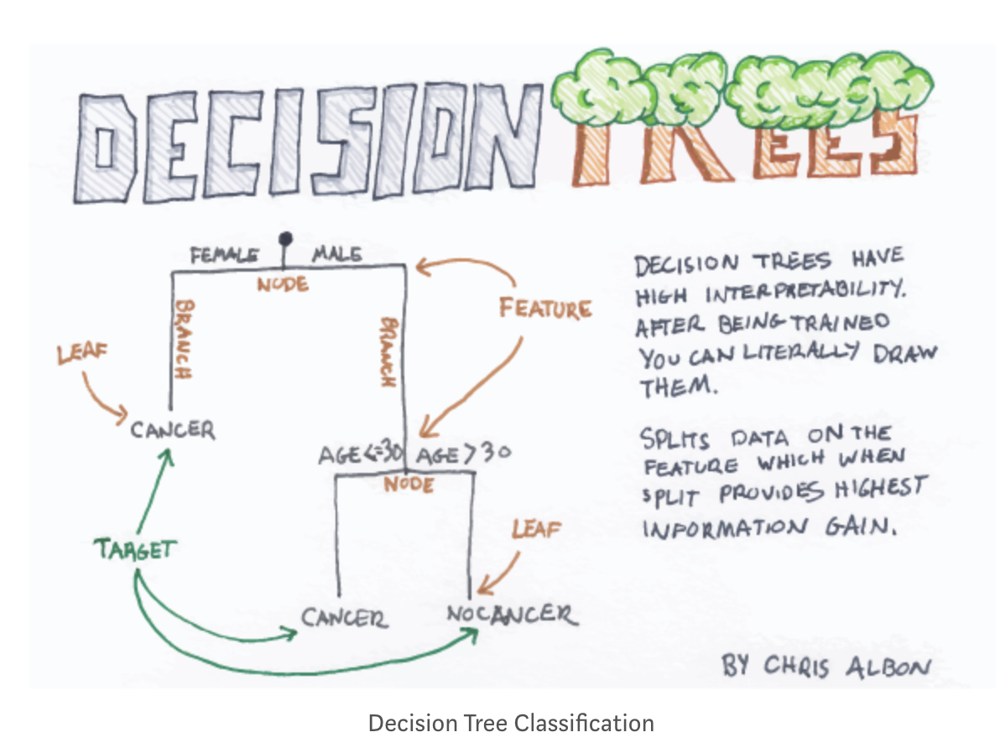

In [161]:
from IPython.display import Image
Image(filename='/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Scripts/dtree.png', width=700, height=350) 

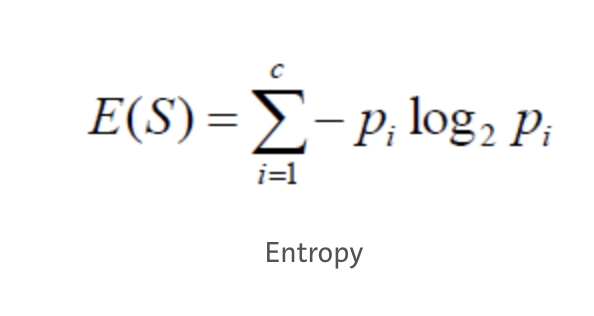

In [159]:

Image(filename='/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Scripts/entropy.png', width=300, height=450) 

In [30]:
from sklearn.svm import SVC
from sklearn.datasets import make_classification

from yellowbrick.features import RFECV

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold


from sklearn.tree import DecisionTreeClassifier


In [43]:
clf = DecisionTreeClassifier(random_state=42)

In [44]:
clf = clf.fit(X_train, y_train)

In [45]:
#print("Features:",[list(df_normalized_w_target.columns)[7:-1]])
#print("Num of Features:", fit.n_features_)
#print("Selected Features:", fit.support_)
#print("Feature Ranking:", fit.ranking_)
from pprint import pprint
feature_names = list(df_normalized_w_target.columns)[7:-1]
pprint(dict(zip(feature_names, clf.feature_importances_)))


{'Hillshade_3pm': 0.025521688989605613,
 'Hillshade_9am': 0.06514089675037689,
 'Hillshade_Noon': 0.035283630154485136,
 'Horizontal_Distance_To_Fire_Points': 0.0736460062727714,
 'Horizontal_Distance_To_Roadways': 0.07842210976459574,
 'Soil_Type_1': 0.0017563059773879188,
 'Soil_Type_10': 0.00783927520246036,
 'Soil_Type_11': 0.001597458261351177,
 'Soil_Type_12': 0.008462841945307149,
 'Soil_Type_13': 0.0011290432522333888,
 'Soil_Type_14': 0.0,
 'Soil_Type_15': 0.0,
 'Soil_Type_16': 0.0015809504296398385,
 'Soil_Type_17': 0.00397098640892068,
 'Soil_Type_18': 0.0,
 'Soil_Type_19': 0.001109285869131416,
 'Soil_Type_2': 0.00345404852913302,
 'Soil_Type_20': 0.001231858964094942,
 'Soil_Type_21': 0.00020577506134001705,
 'Soil_Type_22': 0.0017375558054355735,
 'Soil_Type_23': 0.001554075858126616,
 'Soil_Type_24': 0.0005451296621758979,
 'Soil_Type_25': 0.0,
 'Soil_Type_26': 0.0,
 'Soil_Type_27': 0.0,
 'Soil_Type_28': 0.0,
 'Soil_Type_29': 0.0031803648547735915,
 'Soil_Type_3': 0.0151

In [46]:
#feature_list = pd.DataFrame(columns = (data.columns)[:-1])
feature_list = list(df_normalized_w_target.columns)[7:-1]
len(feature_list)

54

In [47]:
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

#### Decision Tree Model Performance

In [48]:
predictions = dtree.predict(X_test)

In [49]:
from sklearn import metrics
#this is for all the variables
print ("Decision Tree Train Accuracy:", metrics.accuracy_score(y_train, dtree.predict(X_train)))
print ("Decision Tree Test Accuracy:", metrics.accuracy_score(y_test, dtree.predict(X_test)))

Decision Tree Train Accuracy: 1.0
Decision Tree Test Accuracy: 0.7377142857142858


We can see that the decision tree is overfitting--given the training accuracy of 1.0 we know that the "out of the box" model needs to be tweaked and adjusted to account for overfitting

In [50]:
y_pred = dtree.predict(X_test)
print('Accuracy of decision tree classifier on test set: {:.2f}'.format(dtree.score(X_test, y_test)))

Accuracy of decision tree classifier on test set: 0.74


In [51]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
#print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           1       0.62      0.62      0.62       262
           2       0.57      0.54      0.55       270
           3       0.65      0.68      0.67       233
           4       0.92      0.90      0.91       267
           5       0.77      0.83      0.80       234
           6       0.74      0.73      0.74       248
           7       0.90      0.88      0.89       236

    accuracy                           0.74      1750
   macro avg       0.74      0.74      0.74      1750
weighted avg       0.74      0.74      0.74      1750



In [52]:
print(confusion_matrix(y_test,predictions))

[[163  69   0   0  10   0  20]
 [ 69 145  11   1  35   7   2]
 [  0  10 158  15   4  46   0]
 [  0   2  19 240   0   6   0]
 [  8  19   6   0 195   6   0]
 [  1   4  48   5   8 182   0]
 [ 22   6   0   0   0   0 208]]


In [53]:
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydot 

from sklearn.tree import DecisionTreeClassifier
from sklearn import datasets
from IPython.display import Image  
from sklearn import tree
import pydotplus

features = list(feature_list)
features

['elevation',
 'aspect',
 'slope',
 'horizontal_distance_to_hydrology',
 'vertical_distance_to_hydrology',
 'Horizontal_Distance_To_Roadways',
 'Hillshade_9am',
 'Hillshade_Noon',
 'Hillshade_3pm',
 'Horizontal_Distance_To_Fire_Points',
 'Wilderness_Area_1',
 'Wilderness_Area_2',
 'Wilderness_Area_3',
 'Wilderness_Area_4',
 'Soil_Type_1',
 'Soil_Type_2',
 'Soil_Type_3',
 'Soil_Type_4',
 'Soil_Type_5',
 'Soil_Type_6',
 'Soil_Type_7',
 'Soil_Type_8',
 'Soil_Type_9',
 'Soil_Type_10',
 'Soil_Type_11',
 'Soil_Type_12',
 'Soil_Type_13',
 'Soil_Type_14',
 'Soil_Type_15',
 'Soil_Type_16',
 'Soil_Type_17',
 'Soil_Type_18',
 'Soil_Type_19',
 'Soil_Type_20',
 'Soil_Type_21',
 'Soil_Type_22',
 'Soil_Type_23',
 'Soil_Type_24',
 'Soil_Type_25',
 'Soil_Type_26',
 'Soil_Type_27',
 'Soil_Type_28',
 'Soil_Type_29',
 'Soil_Type_30',
 'Soil_Type_31',
 'Soil_Type_32',
 'Soil_Type_33',
 'Soil_Type_34',
 'Soil_Type_35',
 'Soil_Type_36',
 'Soil_Type_37',
 'Soil_Type_38',
 'Soil_Type_39',
 'Soil_Type_40']

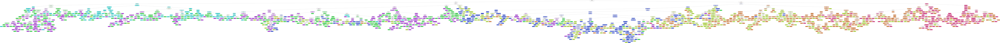

In [156]:
dot_data = StringIO()  
export_graphviz(dtree, out_file=dot_data,feature_names=features,filled=True,rounded=True)
#export_graphviz(dtree,feature_names=features,filled=True,rounded=True)

#graph = pydot.graph_from_dot_data(dot_data.getvalue())  
#Image(graph.create_png()) 

# Create DOT data
#dot_data = tree.export_graphviz(clf, out_file=None, 
                                #feature_names=features,  
                                #class_names=np.unique(y))
# Draw graph
#graph = pydotplus.graph_from_dot_data(dot_data)  

# Show graph
#Image(graph.create_png())
#export_graphviz(dtree, out_file=dot_data,  
               # filled=True, rounded=True,
                #special_characters=True)

#(graph,) = pydot.graph_from_dot_data(dot_data.getvalue())
#graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png())

#note: double click the image to expand it 

**Using Decision Tree Classifiers and including all 54 variables, we get an accuracy rate of about 74%. However, because the training accuracy rate is 1.0, we know that this model is overfitting to the data. We will get back to this later, particularly by pruning nodes.**

### Random Forest  

"Random Forest Classifier is an ensemble algorithm based on bagging i.e bootstrap aggregation." (https://towardsdatascience.com/supervised-machine-learning-classification-5e685fe18a6d) 

"An ensemble model is a team of models. Technically, ensemble models comprise of several supervised learning models that are individually trained, and the results are merged in various ways to achieve the final prediction. This result has higher predictive power than the results of any of its constituting learning algorithms independently." 

As seen in our model above, deep decision trees may suffer from overfitting. However, random forests prevent this because they create trees on "random subsets". Random forests take the average of all the decision tree predictions, which then cancels out the biases associated with overfitting. 

"Random Forest adds additional randomness to the model while growing the trees. Instead of searching for the most important feature while splitting a node, it searches for the best feature among a random subset of features. This results in a wide diversity that generally results in a better model."

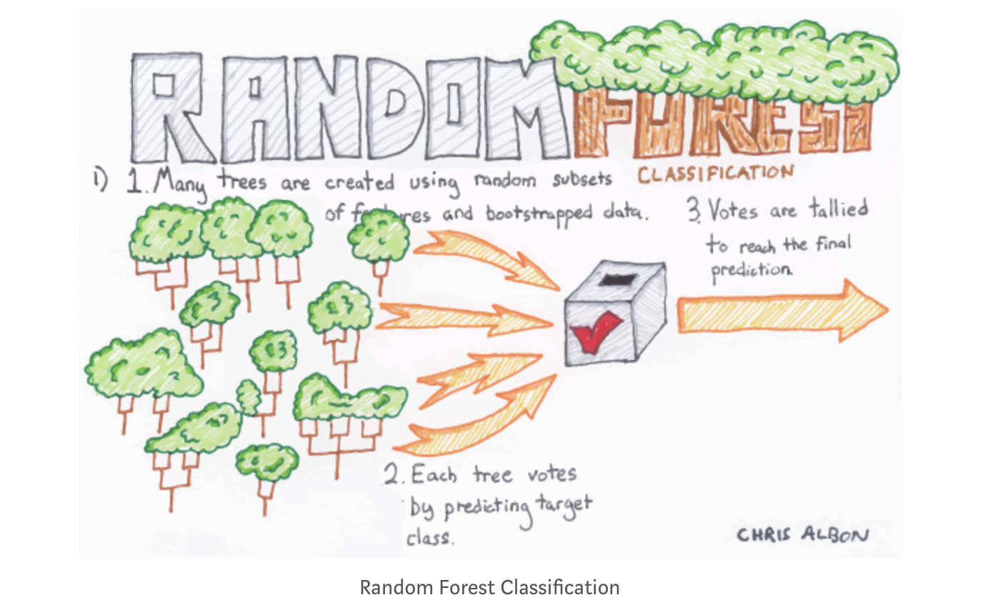

In [164]:

Image(filename='/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Scripts/rforest.png', width=800, height=350) 

In [54]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=100)
rfc.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [55]:
rfc_pred = rfc.predict(X_test)

#### Random Forest Model Performance

In [56]:
y_pred =  rfc.predict(X_test)
print('Accuracy of random forest classifier on test set: {:.2f}'.format(rfc.score(X_test, y_test)))

Accuracy of random forest classifier on test set: 0.81


In [57]:
print(confusion_matrix(y_test,rfc_pred))

[[197  39   0   0   8   0  18]
 [ 61 150   6   0  40  10   3]
 [  0   0 173  19   5  36   0]
 [  0   0   1 261   0   5   0]
 [  1  12   4   0 212   5   0]
 [  0   1  27  10   4 206   0]
 [ 17   0   0   0   0   0 219]]


In [58]:
print(classification_report(y_test,rfc_pred))

              precision    recall  f1-score   support

           1       0.71      0.75      0.73       262
           2       0.74      0.56      0.64       270
           3       0.82      0.74      0.78       233
           4       0.90      0.98      0.94       267
           5       0.79      0.91      0.84       234
           6       0.79      0.83      0.81       248
           7       0.91      0.93      0.92       236

    accuracy                           0.81      1750
   macro avg       0.81      0.81      0.81      1750
weighted avg       0.81      0.81      0.81      1750



**Using Random Forest Classifiers and including all 54 variables, we get an accuracy rate of about 81%.**

### KNN 

K-Nearest Neighbors is a "non-parametric, lazy learning algorithm. It classifies new cases based on a similarity measure (e.g. distance functions)."

"KNN works well with a small number of input variables (p), but struggles when the number of inputs is very large."

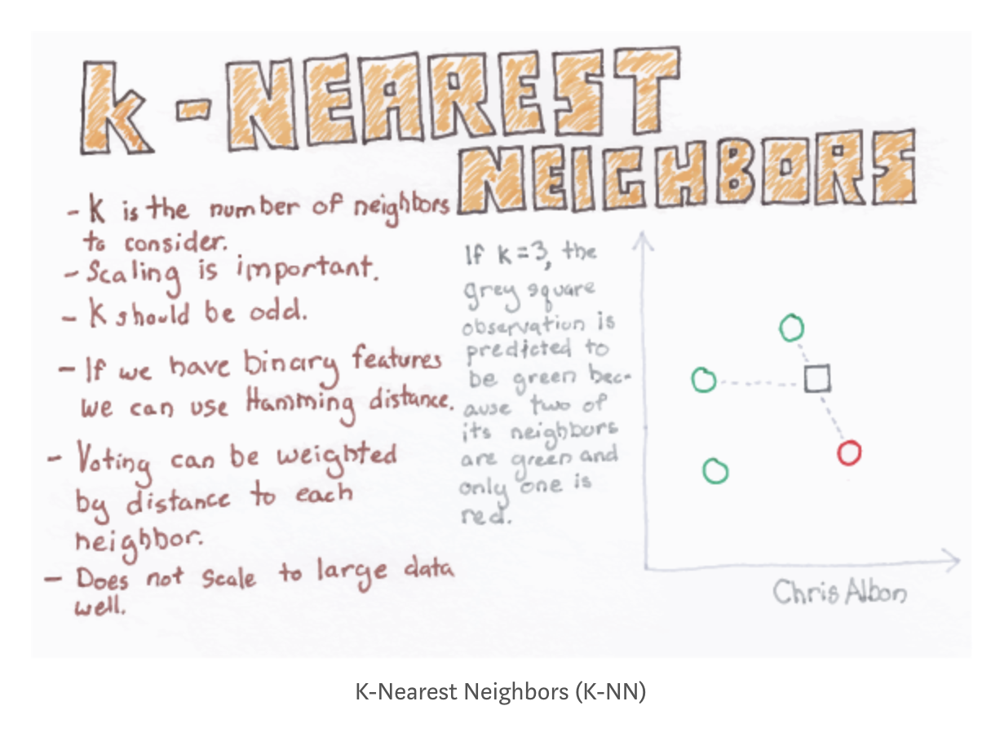

In [179]:

Image(filename='/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Scripts/knn.png', width=700, height=350) 

In [59]:
from sklearn.neighbors import KNeighborsClassifier

In [60]:
knn = KNeighborsClassifier(n_neighbors=1)

In [61]:
knn.fit(X_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')

#### K-Nearest Neighbors Model Evaluation

In [62]:
knn_pred = knn.predict(X_test)

In [63]:
print(confusion_matrix(y_test,knn_pred))

[[163  55   1   0  17   2  24]
 [ 67 131   4   0  46  16   6]
 [  1   3 152  22  11  44   0]
 [  0   0  12 245   0  10   0]
 [  2  10   3   0 214   5   0]
 [  0   6  41   8   4 189   0]
 [ 10   1   0   0   0   0 225]]


In [64]:
print(classification_report(y_test,knn_pred))

              precision    recall  f1-score   support

           1       0.67      0.62      0.65       262
           2       0.64      0.49      0.55       270
           3       0.71      0.65      0.68       233
           4       0.89      0.92      0.90       267
           5       0.73      0.91      0.81       234
           6       0.71      0.76      0.74       248
           7       0.88      0.95      0.92       236

    accuracy                           0.75      1750
   macro avg       0.75      0.76      0.75      1750
weighted avg       0.75      0.75      0.75      1750



In [65]:
y_pred =  knn.predict(X_test)
print('Accuracy of KNN on test set: {:.2f}'.format(knn.score(X_test, y_test)))

Accuracy of KNN on test set: 0.75


**Using K-Nearest Neighbors, and with a k-value of 1, and including all 54 variables, we get an accuracy rate of about 75%.**

### SVM 

Support Vectore Machines are used for both regression and classification problems. This algorithm is based on the concept of decision planes that in turn define respective decision boundaries. "A decision plane(hyperplane) is one that separates between a set of objects having different class memberships." 

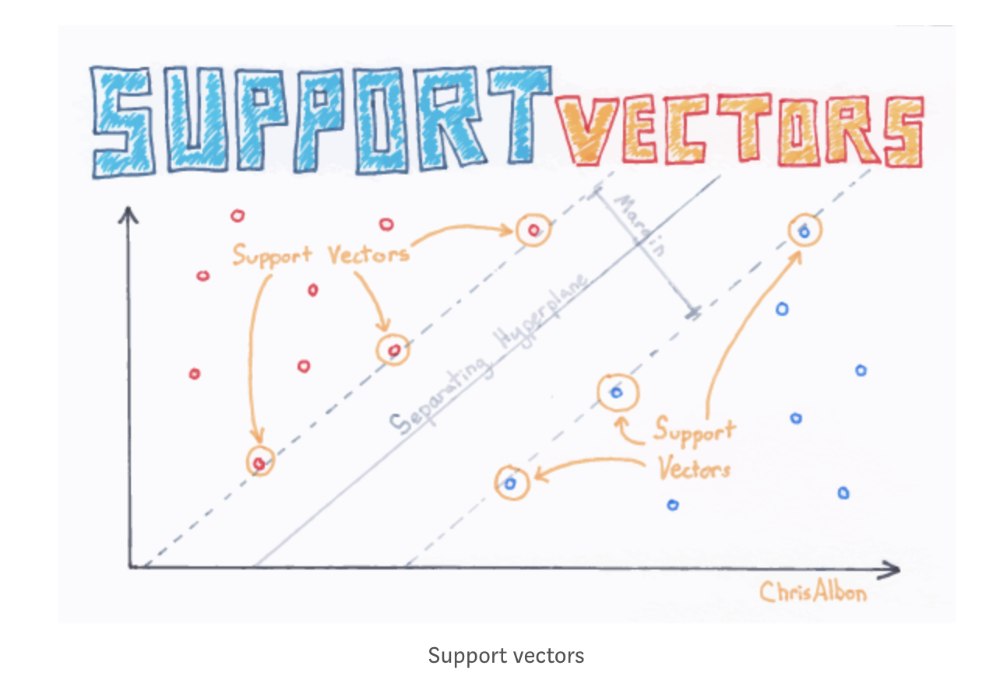

In [180]:

Image(filename='/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Scripts/svm.png', width=700, height=350) 

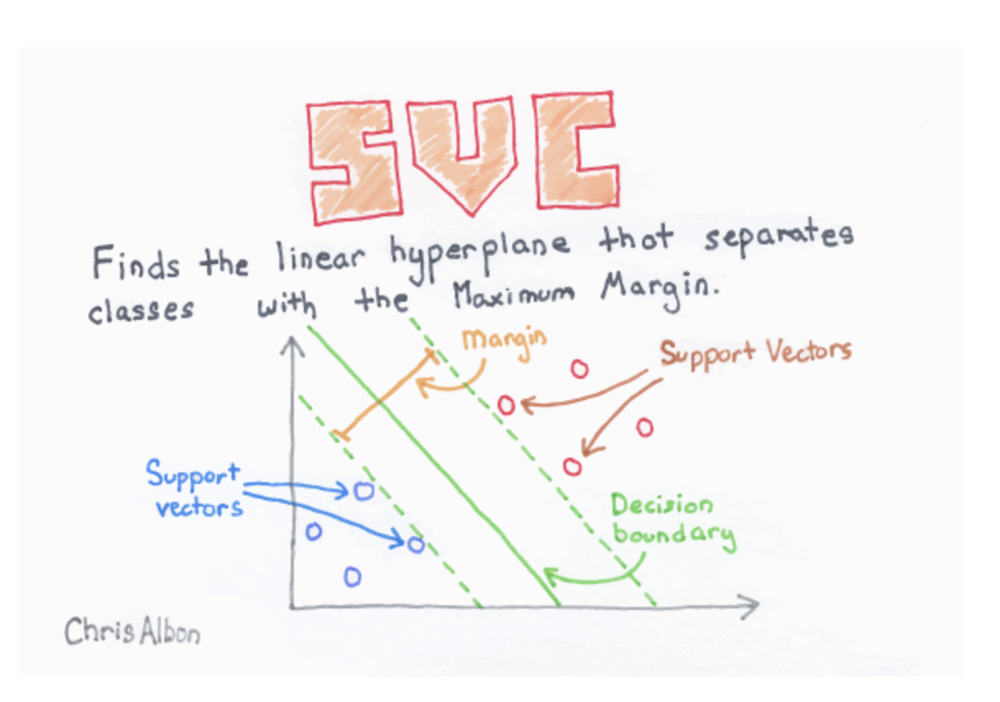

In [181]:

Image(filename='/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Scripts/svc.png', width=700, height=350) 

In [66]:
from sklearn.svm import SVC

In [67]:
svc_model = SVC()

In [68]:
svc_model.fit(X_train,y_train)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

#### Support Vector Machines Model Evaluation

In [69]:
svm_pred = svc_model.predict(X_test)

In [70]:
print(confusion_matrix(y_test,svm_pred))

[[164  61   0   0  16   0  21]
 [117  91   3   1  48  10   0]
 [  2   0  80  78  11  62   0]
 [  0   0   0 251   0  16   0]
 [ 46  29  17   0 136   6   0]
 [  7   6  33  56  25 121   0]
 [ 42  11   0   0   1   0 182]]


In [71]:
print(classification_report(y_test,svm_pred))

              precision    recall  f1-score   support

           1       0.43      0.63      0.51       262
           2       0.46      0.34      0.39       270
           3       0.60      0.34      0.44       233
           4       0.65      0.94      0.77       267
           5       0.57      0.58      0.58       234
           6       0.56      0.49      0.52       248
           7       0.90      0.77      0.83       236

    accuracy                           0.59      1750
   macro avg       0.60      0.58      0.58      1750
weighted avg       0.59      0.59      0.58      1750



In [72]:
print('Accuracy of SVM on test set: {:.2f}'.format(svc_model.score(X_test, y_test)))

Accuracy of SVM on test set: 0.59


**Using Support Vector Machines out of the box, and including all 54 variables, we get an accuracy rate of about 59%. We can tune the parameters more using Gridsearch, although given that the other out of the box models perform much better, it may not be worth the effort.**

### XGBoost 

XGBoost or eXtreme Gradient Boosting, is an "implementation of gradient boosted decision trees designed for speed and performance." (https://machinelearningmastery.com/gentle-introduction-xgboost-applied-machine-learning/)

"Gradient Boosting Classifier is boosting ensemble method. Boosting is a way to combine (ensemble) weak learners, primarily to reduce prediction bias. Instead of creating a pool of predictors, as in bagging, boosting produces a cascade of them, where each output is the input for the following learner." (https://towardsdatascience.com/supervised-machine-learning-classification-5e685fe18a6d)

Moreover, "boosting takes a sequential approach to obtaining predictions. In gradient boosting, each decision tree predicts the error of the previous decision tree — thereby boosting (improving) the error (gradient)." 

According to HackerNoon, XGBoost and gradient boosting are very similar, except for some additional features that XGBoost has, including: (https://hackernoon.com/gradient-boosting-and-xgboost-90862daa6c77)
- Clever Penalisation of Trees
- A Proportional shrinking of leaf nodes
- Newton Boosting
- Extra Randomisation Parameter

It is important to note that the XGBoost library implements the gradient boosting decision tree algorithm.

Helpful links for XGBoost and Gradient Boosting Methods: 
- Information and research by the creator of xgboost https://homes.cs.washington.edu/~tqchen/2016/03/10/story-and-lessons-behind-the-evolution-of-xgboost.html
- ML mastery article about xgboost https://machinelearningmastery.com/gentle-introduction-xgboost-applied-machine-learning/
- Gradient Boosting decision tree algorithm https://en.wikipedia.org/wiki/Gradient_boosting
- https://towardsdatascience.com/interpretable-machine-learning-with-xgboost-9ec80d148d27 
- The Math behind XGBoost https://www.analyticsvidhya.com/blog/2018/09/an-end-to-end-guide-to-understand-the-math-behind-xgboost/ 

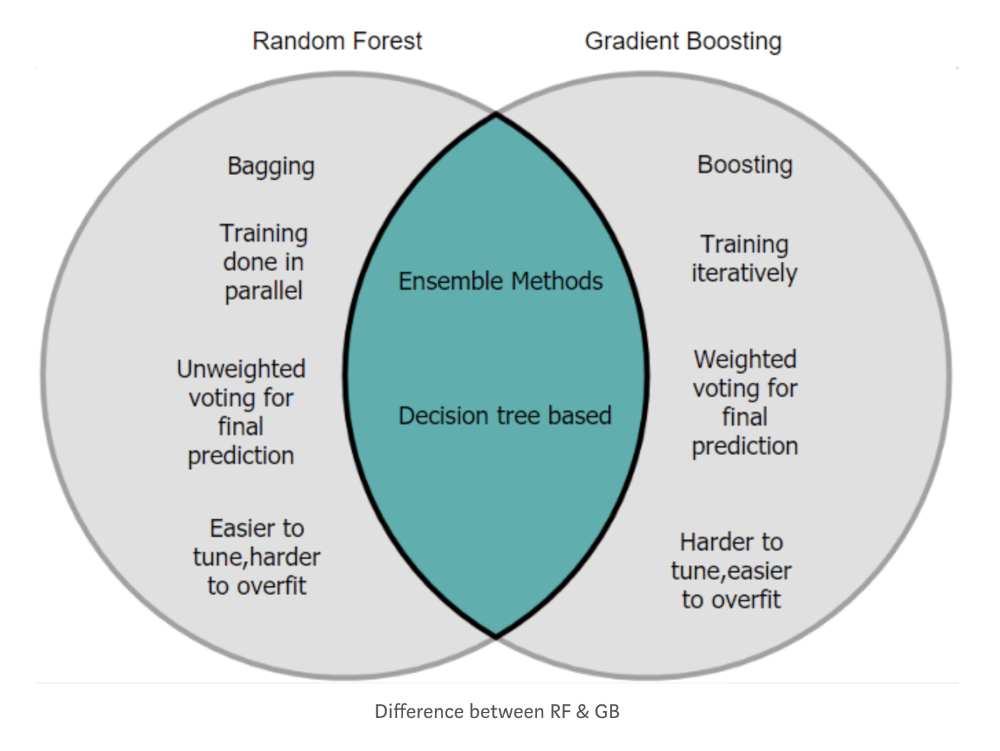

In [191]:

Image(filename='/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Scripts/xgboost.png', width=700, height=350) 

In [31]:
# XGBoost 
from xgboost import XGBClassifier

In [32]:
xgb_clf = XGBClassifier()

In [75]:
xgb_clf.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

#### Extreme Gradient Boosting Model Evaluation

In [76]:
xgb_pred = xgb_clf.predict(X_test)

In [77]:
print(confusion_matrix(y_test,xgb_pred))

[[175  41   0   0  14   1  31]
 [ 74 115   9   0  60   9   3]
 [  0   0 148  19  14  52   0]
 [  0   0   6 257   0   4   0]
 [  1   8   4   0 211  10   0]
 [  0   2  45  13   5 183   0]
 [ 25   0   0   0   0   0 211]]


In [78]:
print(classification_report(y_test,xgb_pred))

              precision    recall  f1-score   support

           1       0.64      0.67      0.65       262
           2       0.69      0.43      0.53       270
           3       0.70      0.64      0.67       233
           4       0.89      0.96      0.92       267
           5       0.69      0.90      0.78       234
           6       0.71      0.74      0.72       248
           7       0.86      0.89      0.88       236

    accuracy                           0.74      1750
   macro avg       0.74      0.75      0.74      1750
weighted avg       0.74      0.74      0.73      1750



In [97]:
print('Accuracy of XGBoost on test set: {:.2f}'.format(xgb_clf.score(X_test, y_test)))

Accuracy of XGBoost on test set: 0.74


**Using Extreme Gradient Boosting out of the box, and including all 54 variables, we get an accuracy rate of about 74%.**




#### XGBoost Parameter Tuning



However, we know that we need to do some parameter turning on XGBoost, as the model does not take categorical variables, which comprise a large chunk of our dataset. For fine tuning this model, the following resources were very helpful:
- https://towardsdatascience.com/fine-tuning-xgboost-in-python-like-a-boss-b4543ed8b1e
- https://xgboost.readthedocs.io/en/latest/tutorials/index.html
- https://www.youtube.com/watch?v=0Xc9LIb_HTw
- https://www.youtube.com/watch?v=YABWwCLPfZs 
- https://www.youtube.com/watch?v=dMulLZKm_pg 
- XGBoost documentation:https://xgboost.readthedocs.io/en/latest/index.html
- Parameters: https://xgboost.readthedocs.io/en/latest/parameter.html
- How to apply grid search for hyperparameter tuning: https://www.kaggle.com/tilii7/hyperparameter-grid-search-with-xgboost
- https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/
- 1vAll: https://medium.com/@gabrielziegler3/multiclass-multilabel-classification-with-xgboost-66195e4d9f2d 
- https://xgboost.readthedocs.io/en/latest/parameter.html
- https://www.kaggle.com/tilii7/hyperparameter-grid-search-with-xgboost
- https://github.com/fmfn/BayesianOptimization
- https://www.kaggle.com/tanitter/grid-search-xgboost-with-scikit-learn
- https://stackoverflow.com/questions/37845920/cross-validation-on-xgbclassifier-for-multiclass-classification-in-python
- https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/
- https://www.kdnuggets.com/2017/03/simple-xgboost-tutorial-iris-dataset.html
- https://xgboost.readthedocs.io/en/latest/index.html
- https://towardsdatascience.com/fine-tuning-xgboost-in-python-like-a-boss-b4543ed8b1e
- https://xgboost.readthedocs.io/en/latest/parameter.html
- https://www.youtube.com/watch?v=dMulLZKm_pg
- https://github.com/jeffheaton/jh-kaggle-util
- https://www.kaggle.com/stuarthallows/using-xgboost-with-scikit-learn

Parameters: 
- gamma [default=0, alias: min_split_loss]
    - Minimum loss reduction required to make a further partition on a leaf node of the tree. The larger gamma is, the more conservative the algorithm will be.; range: [0,∞]
- nthread [default to maximum number of threads available if not set]
    - Number of parallel threads used to run XGBoost
- verbosity
    - Verbosity of printing messages
- booster 
    - which booster to use 

In [126]:
xgb_clf_tune = XGBClassifier(booster='gbtree', verbosity=1, nthread = None, n_jobs=-1, 
                             objective = 'multi:softmax', eval_metric = 'merror', seed=42,)

In [127]:
xgb_clf_tune.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='merror',
              gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=-1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=42,
              silent=None, subsample=1, verbosity=1)

In [128]:
xgb_pred_tune = xgb_clf_tune.predict(X_test)

In [129]:
print(confusion_matrix(y_test,xgb_pred_tune))

[[175  41   0   0  14   1  31]
 [ 74 115   9   0  60   9   3]
 [  0   0 148  19  14  52   0]
 [  0   0   6 257   0   4   0]
 [  1   8   4   0 211  10   0]
 [  0   2  45  13   5 183   0]
 [ 25   0   0   0   0   0 211]]


In [123]:
print(classification_report(y_test,xgb_pred_tune))

              precision    recall  f1-score   support

           1       0.64      0.67      0.65       262
           2       0.69      0.43      0.53       270
           3       0.70      0.64      0.67       233
           4       0.89      0.96      0.92       267
           5       0.69      0.90      0.78       234
           6       0.71      0.74      0.72       248
           7       0.86      0.89      0.88       236

    accuracy                           0.74      1750
   macro avg       0.74      0.75      0.74      1750
weighted avg       0.74      0.74      0.73      1750



In [130]:
print('Accuracy of Manually Tuned XGBoost on test set: {:.2f}'.format(xgb_clf_tune.score(X_test, y_test)))

Accuracy of Manually Tuned XGBoost on test set: 0.74


In [94]:
from datetime import datetime
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold

In [95]:
#timer 
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

In [99]:
# A parameter grid for XGBoost
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

In [186]:
xgb_pred_grid = XGBClassifier(learning_rate=0.02, n_estimators=600, 
                              objective='multi:softmax',
                    silent=True, nthread=1) #n_jobs=-1 )

In [187]:
folds = 3
param_comb = 5

skf = StratifiedKFold(n_splits=folds, shuffle = True, random_state = 1001)

In [188]:
random_search = RandomizedSearchCV(xgb_pred_grid, param_distributions=params, 
                                   n_iter=param_comb, scoring='roc_auc', 
                                   n_jobs=4, cv=skf.split(X_train,y_train), 
                                   verbose=3, random_state=1001 )

However, we can see that not all of these techniques work. So, this means we have to try a different approach for multiclass problems. 


 Time taken: 0 hours 0 minutes and 0.0 seconds.


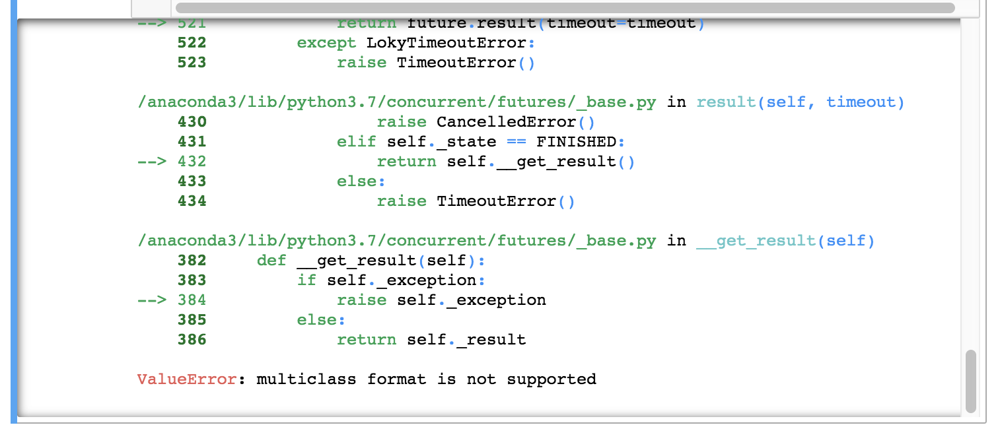

In [190]:
# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
#random_search.fit(X_train,y_train)
timer(start_time) # timing ends here for "start_time" variable


Image(filename='/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Scripts/grid.png', width=700, height=350) 

In [164]:
import xgboost as xgb

#function which will help us create XGBoost models and perform cross-validation
def modelfit(alg, dtrain, predictors,useTrainCV=True, cv_folds=5, early_stopping_rounds=50):
    
    if useTrainCV:
        xgb_param = alg.get_xgb_params()
        xgb_param['num_class'] = 7
        xgtrain = xgb.DMatrix(X_train, label=y_train)
        cvresult = xgb.cv(xgb_param, xgtrain, 
                          num_boost_round=alg.get_params()['n_estimators'], 
                          nfold=cv_folds,
                          metrics='auc', early_stopping_rounds=early_stopping_rounds)
        alg.set_params(n_estimators=cvresult.shape[0])
        
    #Fit the algorithm on the data
    alg.fit(X_train, y_train,eval_metric='auc')
    
    #Predict training set:
    dtrain_predictions = alg.predict(X_train)
    dtrain_predprob = alg.predict_proba(X_train[:,1])
        
    #Print model report:
    print("\nModel Report")
    print("Accuracy : %.4g" % metrics.accuracy_score(X_train, y_train))
    print("AUC Score (Train): %f" % metrics.roc_auc_score(X_train,y_train))
                    
    feat_imp = pd.Series(alg.booster().get_fscore()).sort_values(ascending=False)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')

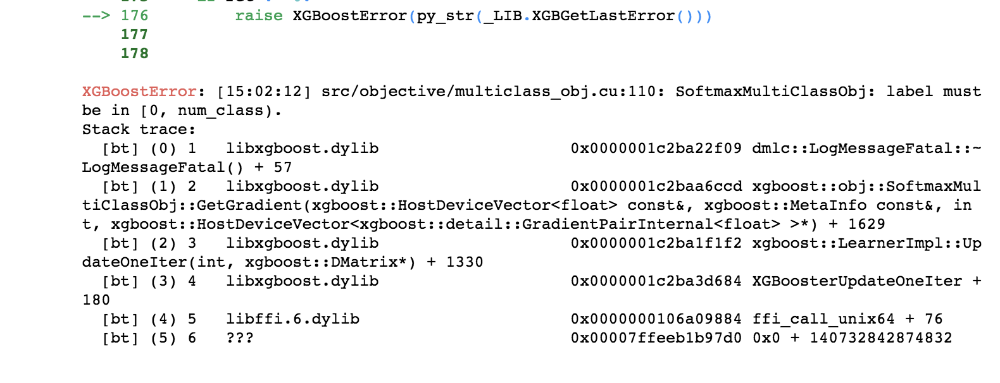

In [179]:
#Choose all predictors except target & IDcols
#predictors = [x for x in X_train if x not in [y_train]]
#https://stackoverflow.com/questions/40116215/xgboost-sklearn-wrapper-value-0for-parameter-num-class-should-be-greater-equal-t

xgb1 = XGBClassifier(
 learning_rate =0.1,
 n_estimators=1000,
 max_depth=5,
 min_child_weight=1,
 gamma=0,
 subsample=0.8,
 colsample_bytree=0.8,
 objective = 'multi:softmax',
 nthread=4,
 scale_pos_weight=1,
 seed=27)

#modelfit(xgb1, X_train, y_train)


Image(filename='/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Scripts/error.png', width=700, height=350) 

In [181]:
from sklearn.multiclass import OneVsRestClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import MultiLabelBinarizer

clf_xgb_2 = OneVsRestClassifier(XGBClassifier(n_jobs=-1, max_depth=4))

# You may need to use MultiLabelBinarizer to encode your variables from arrays [[x, y, z]] to a multilabel 
# format before training.
mlb = MultiLabelBinarizer()
#y = mlb.fit_transform(y)

clf_xgb_2.fit(X_train, y_train)



OneVsRestClassifier(estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                            colsample_bylevel=1,
                                            colsample_bynode=1,
                                            colsample_bytree=1, gamma=0,
                                            learning_rate=0.1, max_delta_step=0,
                                            max_depth=4, min_child_weight=1,
                                            missing=None, n_estimators=100,
                                            n_jobs=-1, nthread=None,
                                            objective='binary:logistic',
                                            random_state=0, reg_alpha=0,
                                            reg_lambda=1, scale_pos_weight=1,
                                            seed=None, silent=None, subsample=1,
                                            verbosity=1),
                    n_jobs=None)

In [169]:
xgb_pred_2 = clf_xgb_2.predict(X_test)

In [171]:
print(confusion_matrix(y_test,xgb_pred_2))

[[185  39   0   0  12   1  25]
 [ 75 121   9   1  54   7   3]
 [  0   1 154  18  11  49   0]
 [  0   0   4 259   0   4   0]
 [  1   8   3   0 215   7   0]
 [  0   0  35   8   5 200   0]
 [ 23   0   0   0   0   0 213]]


In [172]:
print(classification_report(y_test,xgb_pred_2))

              precision    recall  f1-score   support

           1       0.65      0.71      0.68       262
           2       0.72      0.45      0.55       270
           3       0.75      0.66      0.70       233
           4       0.91      0.97      0.94       267
           5       0.72      0.92      0.81       234
           6       0.75      0.81      0.78       248
           7       0.88      0.90      0.89       236

    accuracy                           0.77      1750
   macro avg       0.77      0.77      0.76      1750
weighted avg       0.77      0.77      0.76      1750



In [177]:
print('Accuracy of Manually Tuned XGBoost using OneVAll on test set: {:.2f}'.format(clf_xgb_2.score(X_test, y_test)))

Accuracy of Manually Tuned XGBoost using OneVAll on test set: 0.77


In [203]:
# set xgboost params
param_grid = {
    'max_depth': np.arange(1,10),  # the maximum depth of each tree
    'eta': np.arange(0,1),  # the training step for each iteration
    #'silent': 1,  # logging mode - quiet
    #'objective': 'multi:softmax',  # error evaluation for multiclass training
    'num_class': np.arange(2,8)}  # the number of classes that exist in this datset
num_round = 20  # the number of training iterations

In [205]:
grid_xgb = GridSearchCV(XGBClassifier(),param_grid,refit=True,verbose=2)
grid_xgb.fit(X_train,y_train)

Fitting 3 folds for each of 54 candidates, totalling 162 fits
[CV] eta=0, max_depth=1, num_class=2 .................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .................. eta=0, max_depth=1, num_class=2, total=   3.0s
[CV] eta=0, max_depth=1, num_class=2 .................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.0s remaining:    0.0s


[CV] .................. eta=0, max_depth=1, num_class=2, total=   3.3s
[CV] eta=0, max_depth=1, num_class=2 .................................
[CV] .................. eta=0, max_depth=1, num_class=2, total=   3.0s
[CV] eta=0, max_depth=1, num_class=3 .................................
[CV] .................. eta=0, max_depth=1, num_class=3, total=   2.9s
[CV] eta=0, max_depth=1, num_class=3 .................................
[CV] .................. eta=0, max_depth=1, num_class=3, total=   3.2s
[CV] eta=0, max_depth=1, num_class=3 .................................
[CV] .................. eta=0, max_depth=1, num_class=3, total=   3.2s
[CV] eta=0, max_depth=1, num_class=4 .................................
[CV] .................. eta=0, max_depth=1, num_class=4, total=   2.9s
[CV] eta=0, max_depth=1, num_class=4 .................................
[CV] .................. eta=0, max_depth=1, num_class=4, total=   3.1s
[CV] eta=0, max_depth=1, num_class=4 .................................
[CV] .

[CV] .................. eta=0, max_depth=4, num_class=3, total=   6.1s
[CV] eta=0, max_depth=4, num_class=4 .................................
[CV] .................. eta=0, max_depth=4, num_class=4, total=   6.3s
[CV] eta=0, max_depth=4, num_class=4 .................................
[CV] .................. eta=0, max_depth=4, num_class=4, total=   6.3s
[CV] eta=0, max_depth=4, num_class=4 .................................
[CV] .................. eta=0, max_depth=4, num_class=4, total=   6.3s
[CV] eta=0, max_depth=4, num_class=5 .................................
[CV] .................. eta=0, max_depth=4, num_class=5, total=   5.8s
[CV] eta=0, max_depth=4, num_class=5 .................................
[CV] .................. eta=0, max_depth=4, num_class=5, total=   5.9s
[CV] eta=0, max_depth=4, num_class=5 .................................
[CV] .................. eta=0, max_depth=4, num_class=5, total=   5.8s
[CV] eta=0, max_depth=4, num_class=6 .................................
[CV] .

[CV] .................. eta=0, max_depth=7, num_class=5, total=   9.5s
[CV] eta=0, max_depth=7, num_class=5 .................................
[CV] .................. eta=0, max_depth=7, num_class=5, total=   9.4s
[CV] eta=0, max_depth=7, num_class=5 .................................
[CV] .................. eta=0, max_depth=7, num_class=5, total=   9.5s
[CV] eta=0, max_depth=7, num_class=6 .................................
[CV] .................. eta=0, max_depth=7, num_class=6, total=   8.6s
[CV] eta=0, max_depth=7, num_class=6 .................................
[CV] .................. eta=0, max_depth=7, num_class=6, total=   8.4s
[CV] eta=0, max_depth=7, num_class=6 .................................
[CV] .................. eta=0, max_depth=7, num_class=6, total=   8.9s
[CV] eta=0, max_depth=7, num_class=7 .................................
[CV] .................. eta=0, max_depth=7, num_class=7, total=   8.8s
[CV] eta=0, max_depth=7, num_class=7 .................................
[CV] .

[Parallel(n_jobs=1)]: Done 162 out of 162 | elapsed: 19.3min finished


GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='warn', n_jobs=None,
             param_grid={'eta': array([0]),
                         'max_depth': array([1, 2, 3, 4, 5, 6, 7, 8, 9]),
                         'num_class': array(

In [206]:
grid_predictions_xgb = grid_xgb.predict(X_test)

In [207]:
print(confusion_matrix(y_test,grid_predictions_xgb))

[[190  48   0   0   8   0  16]
 [ 61 152   8   0  41   6   2]
 [  0   2 163  18  13  37   0]
 [  0   0   7 259   0   1   0]
 [  2  11   3   0 215   3   0]
 [  0   2  29   6   5 206   0]
 [ 16   0   0   0   0   0 220]]


In [209]:
print(classification_report(y_test,grid_predictions_xgb))

              precision    recall  f1-score   support

           1       0.71      0.73      0.72       262
           2       0.71      0.56      0.63       270
           3       0.78      0.70      0.74       233
           4       0.92      0.97      0.94       267
           5       0.76      0.92      0.83       234
           6       0.81      0.83      0.82       248
           7       0.92      0.93      0.93       236

    accuracy                           0.80      1750
   macro avg       0.80      0.81      0.80      1750
weighted avg       0.80      0.80      0.80      1750



In [211]:
print('Accuracy of XGBoost Grid Search on test set: {:.2f}'.format(grid_xgb.score(X_test, y_test)))

Accuracy of XGBoost Grid Search on test set: 0.80


**We can see that using grid search on XGBoost, we get an accuracy of 80%.**

<div class="alert alert-block alert-danger">
Notes on errors: 
- I tried to measure incremental model performance improvement and plot it out, as described here, (https://towardsdatascience.com/fine-tuning-xgboost-in-python-like-a-boss-b4543ed8b1e) but I kept getting this error:(https://github.com/dmlc/xgboost/issues/1208; https://github.com/dmlc/xgboost/issues/1143)
    
</div>

## Is feature selection necessary?

Feature selection will be necessary if our models take up a long time to train, or if they tend to overfit too much. Without sampling, model training takes a long time for all of the models, even the simplest ones. However, after we sampled our data to represeent 7000 entries instead of 500,000+, model training did not take too long. In terms of overfitting, our decision tree models seemed to overfit, however, that can be solved by pruning. 

It is important to note that overfitting, and thus having an excess of features increases the odds that meaningless correlations will appear in our training set, so this is an important issue to be careful about. 

To look deeper into this, let's print out the model training times. 

In [213]:
import time
print("Random Forest Classifier")
rfc = RandomForestClassifier(n_estimators=100)
#clf = GaussianNB()
t0=time.time()
#clf.fit(features_train,labels_train)
rfc.fit(X_train, y_train)
print("training time:", round(time.time()-t0, 3), "s") # the time would be round to 3 decimal in seconds
t1=time.time()
rfc_pred = rfc.predict(X_test)
#ypred=clf.predict(features_test)
print("predict time:", round(time.time()-t1, 3), "s")
#x=accuracy_score(labels_test, ypred)
#print(x)

Random Forest Classifier
training time: 0.825 s
predict time: 0.041 s


In [216]:
print("Decision Tree Classifier")
clf = DecisionTreeClassifier(random_state=42)
t0=time.time()
clf = clf.fit(X_train, y_train)
print("training time:", round(time.time()-t0, 3), "s") # the time would be round to 3 decimal in seconds
t1=time.time()
predictions = clf.predict(X_test)
print("predict time:", round(time.time()-t1, 3), "s")


Decision Tree Classifier
training time: 0.058 s
predict time: 0.001 s


In [218]:
print("KNN")
knn = KNeighborsClassifier(n_neighbors=1)
t0=time.time()
knn.fit(X_train,y_train)
print("training time:", round(time.time()-t0, 3), "s") # the time would be round to 3 decimal in seconds
t1=time.time()
knn_pred = knn.predict(X_test)
print("predict time:", round(time.time()-t1, 3), "s")


KNN
training time: 0.039 s
predict time: 0.385 s


In [220]:
print("XGBoost")
xgb_clf = XGBClassifier()
t0=time.time()
xgb_clf.fit(X_train,y_train)
print("training time:", round(time.time()-t0, 3), "s") # the time would be round to 3 decimal in seconds
t1=time.time()
xgb_pred = xgb_clf.predict(X_test)
print("predict time:", round(time.time()-t1, 3), "s")
#x=accuracy_score(labels_test, ypred)
#print(x)

XGBoost
training time: 7.617 s
predict time: 0.052 s


We can see that out of these top 4 models (based on accuracy), XGBoost actually takes the longest time to train. (This is interesting because according to the documentation, it's supposed to be faster.) 

**Does training take too long with the full set of features?** No, as long as we sample the population.

**Knowing that we have to do hyper parameter optimization for these models by scanning over a large set of hyper parameter values using GridSearc, we might end up having to do >100 or even >1000 hyper parameter combinations. Depending on how we do our search, and if we use, for example, 5-fold cross-validation for each combination, that means retraining your model >500 or even >5000 times. Do we have time to wait ~5000 X longer than it takes our model to train once?** This is more of a business question, given that deadlines set are highly dependent on the scope of the problem and on the business need/use case. Personally, when I was running the models, I didn't think that they took too long, so I would be fine with this wait time. Maybe my opinion will change, but I would want to try this at least once firt before concluding about the run-time. 

**However, another keyy point is that we also want to make sure our model isn’t overfitting. If it is (and therefore, if there’s a big discrepancy between your training and testing accuracies), then it’s probably worth removing some features.** As we've seen, only the decision tree classifier seems to be overfitting. We'll need to take a closer look into the other models to see if they are, but for now, we can focus on feature engineering for the decisin tree classifier. 

## If feature selection is necessary, which features should you remove?

First, let's check the correlation matrix to see if there are any features that seem highly correlated with each other (correlation > 0.7 or so). If so, they may be redundant, and could be good candidates for removal.


In [222]:
#variable importance by correlation
cov_type_corr = data.corr()['Cover_Type'][:-1]
cov_type_corr

elevation                            -0.269554
aspect                                0.017080
slope                                 0.148285
horizontal_distance_to_hydrology     -0.020317
vertical_distance_to_hydrology        0.081664
Horizontal_Distance_To_Roadways      -0.153450
Hillshade_9am                        -0.035415
Hillshade_Noon                       -0.096426
Hillshade_3pm                        -0.048290
Horizontal_Distance_To_Fire_Points   -0.108936
Wilderness_Area_1                    -0.203913
Wilderness_Area_2                    -0.048059
Wilderness_Area_3                     0.066846
Wilderness_Area_4                     0.323200
Soil_Type_1                           0.090828
Soil_Type_2                           0.118135
Soil_Type_3                           0.068064
Soil_Type_4                           0.099672
Soil_Type_5                           0.077890
Soil_Type_6                           0.112958
Soil_Type_7                          -0.000496
Soil_Type_8  

In [225]:
golden_features_list = cov_type_corr[abs(cov_type_corr) > 0.7].sort_values(ascending=False)
print("There are {} very correlated values with Cover Type:\n{}".format(len(golden_features_list), golden_features_list))

There are 0 very correlated values with Cover Type:
Series([], Name: Cover_Type, dtype: float64)


In [230]:
golden_features_list = cov_type_corr[abs(cov_type_corr) > 0.3].sort_values(ascending=False)
print("There is {} somewhat correlated values with Cover Type:\n{}".format(len(golden_features_list), golden_features_list))

There is 1 somewhat correlated values with Cover Type:
Wilderness_Area_4    0.3232
Name: Cover_Type, dtype: float64


In [232]:
golden_features_list = cov_type_corr[abs(cov_type_corr) < -0.7].sort_values(ascending=False)
print("There are {} very negatively correlated values with Cover Type:\n{}".format(len(golden_features_list), golden_features_list))

There are 0 very negatively correlated values with Cover Type:
Series([], Name: Cover_Type, dtype: float64)


In [234]:
golden_features_list = cov_type_corr[abs(cov_type_corr) < -0.3].sort_values(ascending=False)
print("There are {} somewhat negativelyy correlated values with Cover Type:\n{}".format(len(golden_features_list), golden_features_list))

There are 0 somewhat negativelyy correlated values with Cover Type:
Series([], Name: Cover_Type, dtype: float64)


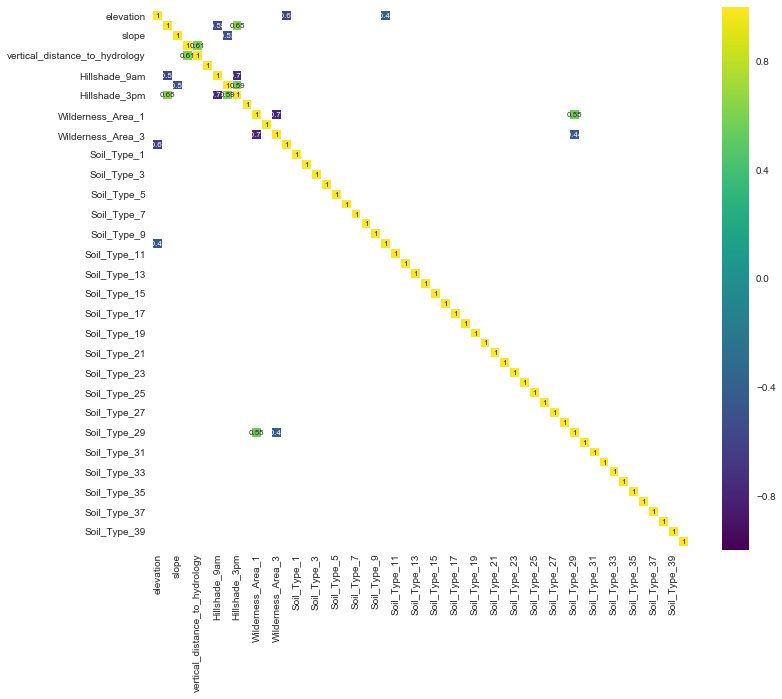

In [235]:
corr = data.drop('Cover_Type', axis=1).corr() 
plt.figure(figsize=(12, 10))

sns.heatmap(corr[(corr >= 0.5) | (corr <= -0.4)], 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);

Based on the above correlations, it seems that most variables are either (a) not correlated with the target variable at all, or (b) do not have a linear correlation, or (c) correlated with the target variable, but only when you factor in another input (e.g. X1 and X2 individually don’t appear correlated to Y, but it could turn out that every time X1 AND X2 are both negative, Y = class 2, for example - that also wouldn’t be captured by a correlation matrix).

To test this out, we can use a scatterplot. 


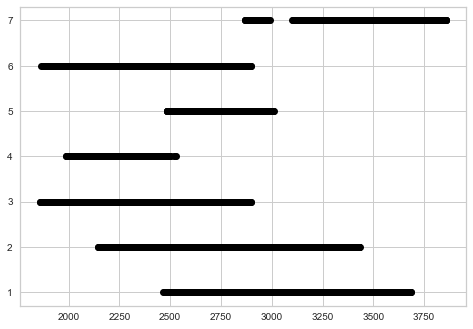

In [239]:
plt.plot(data["elevation"], data["Cover_Type"], 'o', color='black');

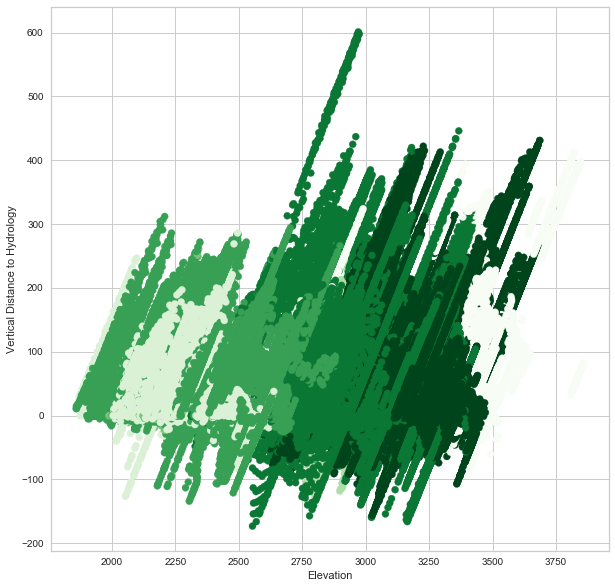

In [246]:
plt.figure(figsize=(10,10))
plt.scatter(data["elevation"], data["vertical_distance_to_hydrology"], c=data["Cover_Type"], cmap=plt.cm.Greens_r)
plt.xlabel("Elevation")
plt.ylabel("Vertical Distance to Hydrology")
plt.show()

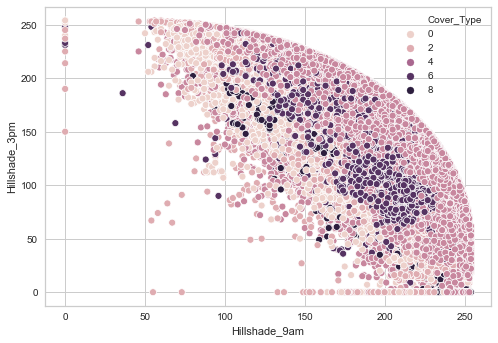

In [254]:
ax = sns.scatterplot(x=data['Hillshade_9am'], y=data['Hillshade_3pm'], hue=data['Cover_Type'], data=data)

In [256]:
#*why is the covertype showing up as 0 2 4 6 and 8??
#data['Cover_Type'].unique
data.groupby('Cover_Type').size()

Cover_Type
1    211840
2    283301
3     35754
4      2747
5      9493
6     17367
7     20510
dtype: int64

Since correlation-based methods didn't yield as much information, given that 0 variables have > 0.7 corr coeff with our target, I would prefer not to rely on a naive filter based method. So, we'll now use model-based techniques to verify that these parameters are indeed not useful predictors of cover type. 

To do this, we will be using feature importance-based methods. It is important to note that we will get different sets of important features depending on the model we're using, sincedifferent models fixate on different features.

###  Feature Selection by RFE for Logistic Regression

In [257]:
from sklearn.svm import SVC
from sklearn.datasets import make_classification

from yellowbrick.features import RFECV

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold

from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [258]:
# feature extraction of top 5 features
model = LogisticRegression()
rfe = RFE(model, 5)
fit = rfe.fit(X_train, y_train)

In [259]:
print("Features:",[list(df_normalized_w_target.columns)[7:-1]])
print("Num of Features:", fit.n_features_)
print("Selected Features:", fit.support_)
print("Feature Ranking:", fit.ranking_)


Features: [['elevation', 'aspect', 'slope', 'horizontal_distance_to_hydrology', 'vertical_distance_to_hydrology', 'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area_1', 'Wilderness_Area_2', 'Wilderness_Area_3', 'Wilderness_Area_4', 'Soil_Type_1', 'Soil_Type_2', 'Soil_Type_3', 'Soil_Type_4', 'Soil_Type_5', 'Soil_Type_6', 'Soil_Type_7', 'Soil_Type_8', 'Soil_Type_9', 'Soil_Type_10', 'Soil_Type_11', 'Soil_Type_12', 'Soil_Type_13', 'Soil_Type_14', 'Soil_Type_15', 'Soil_Type_16', 'Soil_Type_17', 'Soil_Type_18', 'Soil_Type_19', 'Soil_Type_20', 'Soil_Type_21', 'Soil_Type_22', 'Soil_Type_23', 'Soil_Type_24', 'Soil_Type_25', 'Soil_Type_26', 'Soil_Type_27', 'Soil_Type_28', 'Soil_Type_29', 'Soil_Type_30', 'Soil_Type_31', 'Soil_Type_32', 'Soil_Type_33', 'Soil_Type_34', 'Soil_Type_35', 'Soil_Type_36', 'Soil_Type_37', 'Soil_Type_38', 'Soil_Type_39', 'Soil_Type_40']]
Num of Features: 5
Selected Features: [ True 

In [261]:
#feature_list = pd.DataFrame(columns = (data.columns)[:-1])
feature_list = list(df_normalized_w_target.columns)[7:-1]
print(len(feature_list))
included_features = list(fit.support_)
print(len(included_features))

54
54


In [263]:
feature_ranking = list(fit.ranking_)
ft_df = {'Features': feature_list, "Included?": included_features, 'Ranking':feature_ranking }
list_of_log_features = pd.DataFrame(ft_df)
list_of_log_features.sort_values(by='Ranking')

,Features,Included?,Ranking
0,elevation,True,1
3,horizontal_distance_to_hydrology,True,1
13,Wilderness_Area_4,True,1
7,Hillshade_Noon,True,1
8,Hillshade_3pm,True,1
5,Horizontal_Distance_To_Roadways,False,2
12,Wilderness_Area_3,False,3
52,Soil_Type_39,False,4
51,Soil_Type_38,False,5
53,Soil_Type_40,False,6


We've now identified the top 5 features by their importance--yet how do we know how many features is optimal? 

### Feature Selction for Decision Trees

In [264]:
from sklearn.svm import SVC
from sklearn.datasets import make_classification

from yellowbrick.features import RFECV

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold


from sklearn.tree import DecisionTreeClassifier



In [265]:
clf = DecisionTreeClassifier(random_state=42)
clf = clf.fit(X_train, y_train)
#print("Features:",[list(df_normalized_w_target.columns)[7:-1]])
#print("Num of Features:", fit.n_features_)
#print("Selected Features:", fit.support_)
#print("Feature Ranking:", fit.ranking_)
from pprint import pprint
feature_names = list(df_normalized_w_target.columns)[7:-1]
pprint(dict(zip(feature_names, clf.feature_importances_)))

#feature_list = pd.DataFrame(columns = (data.columns)[:-1])
feature_list = list(df_normalized_w_target.columns)[7:-1]
print(len(feature_list))

included_features = list(fit.support_)
print(len(included_features))

feature_ranking = list(fit.ranking_)
print(len(feature_ranking))

{'Hillshade_3pm': 0.025521688989605613,
 'Hillshade_9am': 0.06514089675037689,
 'Hillshade_Noon': 0.035283630154485136,
 'Horizontal_Distance_To_Fire_Points': 0.0736460062727714,
 'Horizontal_Distance_To_Roadways': 0.07842210976459574,
 'Soil_Type_1': 0.0017563059773879188,
 'Soil_Type_10': 0.00783927520246036,
 'Soil_Type_11': 0.001597458261351177,
 'Soil_Type_12': 0.008462841945307149,
 'Soil_Type_13': 0.0011290432522333888,
 'Soil_Type_14': 0.0,
 'Soil_Type_15': 0.0,
 'Soil_Type_16': 0.0015809504296398385,
 'Soil_Type_17': 0.00397098640892068,
 'Soil_Type_18': 0.0,
 'Soil_Type_19': 0.001109285869131416,
 'Soil_Type_2': 0.00345404852913302,
 'Soil_Type_20': 0.001231858964094942,
 'Soil_Type_21': 0.00020577506134001705,
 'Soil_Type_22': 0.0017375558054355735,
 'Soil_Type_23': 0.001554075858126616,
 'Soil_Type_24': 0.0005451296621758979,
 'Soil_Type_25': 0.0,
 'Soil_Type_26': 0.0,
 'Soil_Type_27': 0.0,
 'Soil_Type_28': 0.0,
 'Soil_Type_29': 0.0031803648547735915,
 'Soil_Type_3': 0.0151

In [266]:
ft_df = {'Features': feature_list, "Included?": included_features, 'Ranking':feature_ranking }
list_of_log_features = pd.DataFrame(ft_df)
list_of_log_features.sort_values(by='Ranking')

,Features,Included?,Ranking
0,elevation,True,1
3,horizontal_distance_to_hydrology,True,1
13,Wilderness_Area_4,True,1
7,Hillshade_Noon,True,1
8,Hillshade_3pm,True,1
5,Horizontal_Distance_To_Roadways,False,2
12,Wilderness_Area_3,False,3
52,Soil_Type_39,False,4
51,Soil_Type_38,False,5
53,Soil_Type_40,False,6


### XGBoost Feature Importance

In [272]:
xgb_clf = XGBClassifier()
xgb_clf.fit(X_train,y_train)

feature_names = list(df_normalized_w_target.columns)[7:-1]
#pprint(dict(zip(feature_names, clf.feature_importances_)))

#feature_list = pd.DataFrame(columns = (data.columns)[:-1])
feature_list = list(df_normalized_w_target.columns)[7:-1]
#print(len(feature_list))

included_features = list(fit.support_)
#print(len(included_features))

feature_ranking = list(fit.ranking_)
#print(len(feature_ranking))
print(xgb_clf.feature_importances_)
#pprint(feature_ranking)
ft_df = {'Features': feature_list, "Included?": included_features, 'Ranking':feature_ranking }
list_xgb_features = pd.DataFrame(ft_df)
list_xgb_features.sort_values(by='Ranking')

[0.10948668 0.011235   0.00842987 0.02505924 0.0112255  0.01430156
 0.03053639 0.01422864 0.01098048 0.01314118 0.02440133 0.01440734
 0.01482327 0.08756799 0.00483466 0.01462263 0.07549521 0.02337505
 0.00379447 0.01018707 0.         0.         0.         0.09290311
 0.00776696 0.0392755  0.00681213 0.         0.         0.00541309
 0.0172392  0.         0.         0.01011558 0.         0.02357673
 0.00569515 0.01305319 0.         0.         0.         0.
 0.02865543 0.14040351 0.01030675 0.01011886 0.00836661 0.
 0.0043657  0.         0.         0.02261721 0.02305619 0.00812558]


,Features,Included?,Ranking
0,elevation,True,1
3,horizontal_distance_to_hydrology,True,1
13,Wilderness_Area_4,True,1
7,Hillshade_Noon,True,1
8,Hillshade_3pm,True,1
5,Horizontal_Distance_To_Roadways,False,2
12,Wilderness_Area_3,False,3
52,Soil_Type_39,False,4
51,Soil_Type_38,False,5
53,Soil_Type_40,False,6


As seen above, we haven't really seen the *extreme* need for feature selection for random forests, KNN, and XGBoost. However, there are some ways to do this and show the feature importance for these algorithms. Some helpful links are below: (which I will attempt in the next commit of this notebook) 
- KNN: https://bmcbioinformatics.biomedcentral.com/articles/10.1186/1471-2105-12-450
- Random Forests: 
    - https://blog.datadive.net/selecting-good-features-part-iii-random-forests/
    - https://towardsdatascience.com/explaining-feature-importance-by-example-of-a-random-forest-d9166011959e
- XGBoost: https://machinelearningmastery.com/feature-importance-and-feature-selection-with-xgboost-in-python/

## How accurate can an individual model be on the covertype dataset, given the time and data availability constraints?

Now, we are going to tune the best performing models we identified. Our top 2 performing models are Random Forests and KNN. 

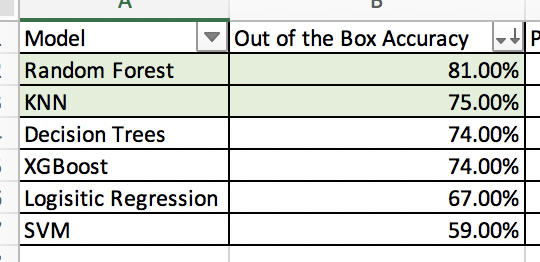

In [274]:

Image(filename='/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Scripts/accuracy.png', width=300, height=250) 

### KNN Parameter Tuning

In [275]:
#out of the box model
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train,y_train)
knn_pred = knn.predict(X_test)
print(confusion_matrix(y_test,knn_pred))

[[163  55   1   0  17   2  24]
 [ 67 131   4   0  46  16   6]
 [  1   3 152  22  11  44   0]
 [  0   0  12 245   0  10   0]
 [  2  10   3   0 214   5   0]
 [  0   6  41   8   4 189   0]
 [ 10   1   0   0   0   0 225]]


In [277]:
print(classification_report(y_test,knn_pred))

              precision    recall  f1-score   support

           1       0.67      0.62      0.65       262
           2       0.64      0.49      0.55       270
           3       0.71      0.65      0.68       233
           4       0.89      0.92      0.90       267
           5       0.73      0.91      0.81       234
           6       0.71      0.76      0.74       248
           7       0.88      0.95      0.92       236

    accuracy                           0.75      1750
   macro avg       0.75      0.76      0.75      1750
weighted avg       0.75      0.75      0.75      1750



In [278]:
y_pred =  knn.predict(X_test)
print('Accuracy of KNN on test set: {:.2f}'.format(knn.score(X_test, y_test)))

Accuracy of KNN on test set: 0.75


For KNN, the main parameter we need to decide on is the value of K, meaning how many neighbors do we want to compare each point to? 

Useful resources: 
- https://medium.com/@mohtedibf/in-depth-parameter-tuning-for-knn-4c0de485baf6 
- https://www.udemy.com/python-for-data-science-and-machine-learning-bootcamp/
- https://www.quora.com/What-are-the-factors-that-affect-the-error-rate-in-the-KNN-algorithm

In [279]:
error_rate = []

# Will take some time
for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

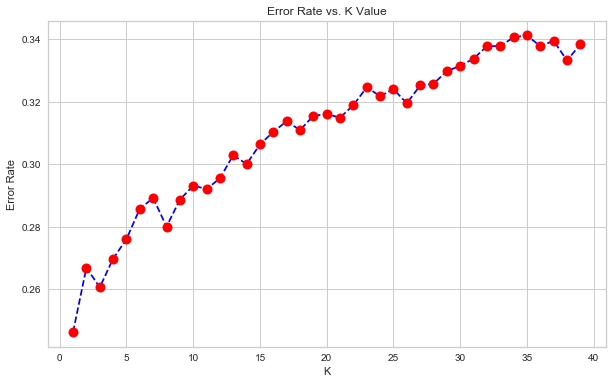

In [280]:
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

We can see that as the number of neighbors increases, so does the error rate. This is a bit surprising, since I would expect the opposite effect. It seems that we get the lowest error rate at K=2. 

It is important to note that there are 3 main factors that affect the error rate in the KNN algorithm, as described on Quora (https://www.quora.com/What-are-the-factors-that-affect-the-error-rate-in-the-KNN-algorithm): 
1. Dimensionality of Data Points - The higher the dimensionality of the data points the less reliable the KNN algorithm becomes. 
2. K Value - The K returned neighbors affect the accuracy as well, there is normally a K value that gives good performance depending on application, use the ROC curve to find a suitable K value for your problem. Normally K = 1 is too noisy, to smooth things out try K = 3 or 5. However, larger K values will tend to bias the KNN algorithm towards a dominant class. 
3. Data Distribution - The way the training data is distributed can easily affect the performance of the KNN classifier. Regions of high data point concentration will be more sensitive to small changes while low density regions will tolerate larger changes. This is because a query point falling in a dense area will easily map to a new set of K nearest neighbors just by small perturbations while a query point that falls in a low density region will have to shift by much before the K nearest neighbors change. This can be problematic as the data distribution can never be uniform for the KNN algorithm as it only memorizes the discrete training examples. This can be resolved by using a very large training set but with increased memory and computational complexity since 𝑂(𝑛) for 𝑛 data points for both memory and computational complexity for brute force search strategy.


Let's now retrain this model based on this K=2 value.

In [281]:
#out of the box model
knn = KNeighborsClassifier(n_neighbors=2)
knn.fit(X_train,y_train)
knn_pred = knn.predict(X_test)
print(confusion_matrix(y_test,knn_pred))

[[199  40   0   0   9   1  13]
 [104 113   7   0  31  12   3]
 [  1  10 168  22   8  24   0]
 [  0   0  19 246   0   2   0]
 [  5  27   1   0 199   2   0]
 [  0  11  62  16   4 155   0]
 [ 30   2   0   0   1   0 203]]


In [282]:
print(classification_report(y_test,knn_pred))

              precision    recall  f1-score   support

           1       0.59      0.76      0.66       262
           2       0.56      0.42      0.48       270
           3       0.65      0.72      0.69       233
           4       0.87      0.92      0.89       267
           5       0.79      0.85      0.82       234
           6       0.79      0.62      0.70       248
           7       0.93      0.86      0.89       236

    accuracy                           0.73      1750
   macro avg       0.74      0.74      0.73      1750
weighted avg       0.74      0.73      0.73      1750



In [283]:
y_pred =  knn.predict(X_test)
print('Accuracy of KNN on test set: {:.2f}'.format(knn.score(X_test, y_test)))

Accuracy of KNN on test set: 0.73


Weirdly, we got a lower accuracy. 


<div class="alert alert-block alert-danger">
Need to discuss this with Jeremie! Parameter tuning for KNN -- I seem to be getting lower accuracy even as I increase K.
</div>

### Random Forests Parameter Turing 

In [222]:
# Random forest baseline performance
rfc = RandomForestClassifier(n_estimators=100)
rfc.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [223]:
print(confusion_matrix(y_test,rfc_pred))

[[197  39   0   0   8   0  18]
 [ 61 150   6   0  40  10   3]
 [  0   0 173  19   5  36   0]
 [  0   0   1 261   0   5   0]
 [  1  12   4   0 212   5   0]
 [  0   1  27  10   4 206   0]
 [ 17   0   0   0   0   0 219]]


In [224]:
print(classification_report(y_test,rfc_pred))

              precision    recall  f1-score   support

           1       0.71      0.75      0.73       262
           2       0.74      0.56      0.64       270
           3       0.82      0.74      0.78       233
           4       0.90      0.98      0.94       267
           5       0.79      0.91      0.84       234
           6       0.79      0.83      0.81       248
           7       0.91      0.93      0.92       236

    accuracy                           0.81      1750
   macro avg       0.81      0.81      0.81      1750
weighted avg       0.81      0.81      0.81      1750



In [225]:
y_pred =  rfc.predict(X_test)
print('Accuracy of random forest classifier on test set: {:.2f}'.format(rfc.score(X_test, y_test)))

Accuracy of random forest classifier on test set: 0.81


<div class="alert alert-block alert-danger">
One evaluation metric that can be used is the AUC Curve (Area under the curve). However, multiclass format is not supported...
</div>

In [242]:
#from sklearn.metrics import roc_curve, auc
#false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
#roc_auc = auc(false_positive_rate, true_positive_rate)
#roc_auc

# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(rfc.get_params())


Parameters currently in use:

{'bootstrap': True,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


To tune our random forest, we can use a random hyperparameter grid. 

The steps to do this are as follows: 
1. Create a parameter grid to sample from during fitting. 
    - From each of these iteration, the gridsearch algorithm will choose a difference combination of the features. Altogether, there are 2 * 12 * 2 * 3 * 3 * 10 = 4320 settings possible, given the below parameter options. 
2. Create an instance of random search and fit the model.
3. Compare the challenger model with the baseline model

The most important arguments in RandomizedSearchCV: 
- n_iter: controls the number of different combinations to try
- cv: the number of folds to use for cross validation (we use 100 and 3 respectively). 

"More iterations will cover a wider search space and more cv folds reduces the chances of overfitting, but raising each will increase the run time. Machine learning is a field of trade-offs, and performance vs time is one of the most fundamental."

Helpful Links: 
- https://medium.com/all-things-ai/in-depth-parameter-tuning-for-random-forest-d67bb7e920d 
- Documentation: http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
- Research Papers: https://www.stat.berkeley.edu/~breiman/randomforest2001.pdf
- https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74


In [227]:
from sklearn.model_selection import RandomizedSearchCV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


In [298]:
# Use the random grid to search for best hyperparameters
from sklearn.ensemble import RandomForestRegressor
# First create the base model to tune
rfr = RandomForestRegressor()

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores

rf_random = RandomizedSearchCV(estimator = rfr, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 24.9min finished


RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators='warn',
                                                   n_jobs=None, oob_score=False,
                                                   random_sta...


According to the documentation, the parameters found in RandomizedSearchCV for the Random Forst Classifier are as follows: 
- n_estimators: The number of trees in the forest.
- min_samples_split: The minimum number of samples required to split an internal node
- min_samples_leaf: The minimum number of samples required to be at a leaf node. A split point at any depth will only be considered if it leaves at least min_samples_leaf training samples in each of the left and right branches. This may have the effect of smoothing the model, especially in regression.
- max_features: The number of features to consider when looking for the best split
    - If “sqrt”, then max_features=sqrt(n_features) (same as “auto”).
- max_depth: The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.
- bootstrap: Whether bootstrap samples are used when building trees. If False, the whole datset is used to build each tree.


*Note: I only realized later on that random search and grid search are not the same, although they should yield similar results. On this link are the differences between the 2--although the most significant one is just that random search is much **much** slower. (https://scikit-learn.org/stable/auto_examples/model_selection/plot_randomized_search.html)*

Helpful Links: 
- https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html 
- https://scikit-learn.org/stable/auto_examples/model_selection/plot_randomized_search.html
- https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
- https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html 
- https://chrisalbon.com/
- https://towardsdatascience.com/supervised-machine-learning-classification-5e685fe18a6d
- https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74



Based on the random hyperparameter grid, the best parameters are listed below: 

In [299]:
rf_random.best_params_

{'n_estimators': 400,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': None,
 'bootstrap': False}

In [228]:
#apply these and compare results
# Random forest peak performance
rfc_peak = RandomForestClassifier(n_estimators=400, min_samples_split = 2, min_samples_leaf = 1, max_features = 'sqrt', max_depth = None, bootstrap = False)
rfc_peak.fit(X_train, y_train)

RandomForestClassifier(bootstrap=False, class_weight=None, criterion='gini',
                       max_depth=None, max_features='sqrt', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=400,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [229]:
rfc_pred_peak = rfc.predict(X_test)
print(confusion_matrix(y_test,rfc_pred_peak))

[[201  37   0   0   6   0  18]
 [ 63 151   5   0  40   9   2]
 [  0   0 171  19   6  37   0]
 [  0   0   1 263   0   3   0]
 [  1  12   4   0 212   5   0]
 [  0   1  26  10   5 206   0]
 [ 14   1   0   0   1   0 220]]


In [230]:
print(classification_report(y_test,rfc_pred_peak))

              precision    recall  f1-score   support

           1       0.72      0.77      0.74       262
           2       0.75      0.56      0.64       270
           3       0.83      0.73      0.78       233
           4       0.90      0.99      0.94       267
           5       0.79      0.91      0.84       234
           6       0.79      0.83      0.81       248
           7       0.92      0.93      0.92       236

    accuracy                           0.81      1750
   macro avg       0.81      0.82      0.81      1750
weighted avg       0.81      0.81      0.81      1750



In [231]:
y_pred_peak =  rfc_peak.predict(X_test)
print('Accuracy of random forest classifier on test set: {:.2f}'.format(rfc_peak.score(X_test, y_test)))

Accuracy of random forest classifier on test set: 0.82


So it appears that this model is 1% better than the out of the box random forest model, in terms of accuracy. Hm. Parameter tuning seems just o.k. for both KNN and random forests. I thought that these would perform a lot better now, but they either performed just the same, or worse as the out of the box model. Let's try looking at other models before we jump into ensembling. 

### SVM Parameter Turing 

In [308]:
#use grid search for parameter tuning
from sklearn.model_selection import GridSearchCV

In [309]:
svc_model.fit(X_train,y_train)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

Note that the initial model performance for SVC had an accuracy of 59%, which was the lowest of all 6 models we tested. 

Important parametrs in SVC / SVM modeling are: 
- C: Penalty parameter C of the error term.
- kernel: Specifies the kernel type to be used in the algorithm. It must be one of ‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’, ‘precomputed’ or a callable. If none is given, ‘rbf’ will be used. 
- gamma: Kernel coefficient for ‘rbf’, ‘poly’ and ‘sigmoid’. Current default is ‘auto’ which uses 1 / n_features

In other words, gamma is a "parameter for non linear hyperplanes". The higher the gamma value, the more the algorithm tries to fit the training set exactly. "C is the penalty parameter of the error term. It controls the trade off between smooth decision boundary and classifying the training points correctly."

Helpful Links: 
- SVM vs SVC: https://stackoverflow.com/questions/27912872/what-is-the-difference-between-svc-and-svm-in-scikit-learn
- SVC parameter tuning: https://medium.com/all-things-ai/in-depth-parameter-tuning-for-svc-758215394769


In [310]:
# Create a dictionary with parameter values for C and gamma
param_grid = {'C': [0.1,1, 10, 100], 'gamma': [1,0.1,0.01,0.001]} 

In [311]:
grid = GridSearchCV(SVC(),param_grid,refit=True,verbose=2)
grid.fit(X_train,y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits
[CV] C=0.1, gamma=1 ..................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................................... C=0.1, gamma=1, total=   1.4s
[CV] C=0.1, gamma=1 ..................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s remaining:    0.0s


[CV] ................................... C=0.1, gamma=1, total=   1.5s
[CV] C=0.1, gamma=1 ..................................................
[CV] ................................... C=0.1, gamma=1, total=   1.3s
[CV] C=0.1, gamma=0.1 ................................................
[CV] ................................. C=0.1, gamma=0.1, total=   1.4s
[CV] C=0.1, gamma=0.1 ................................................
[CV] ................................. C=0.1, gamma=0.1, total=   1.4s
[CV] C=0.1, gamma=0.1 ................................................
[CV] ................................. C=0.1, gamma=0.1, total=   1.5s
[CV] C=0.1, gamma=0.01 ...............................................
[CV] ................................ C=0.1, gamma=0.01, total=   2.1s
[CV] C=0.1, gamma=0.01 ...............................................
[CV] ................................ C=0.1, gamma=0.01, total=   2.1s
[CV] C=0.1, gamma=0.01 ...............................................
[CV] .

[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:   58.9s finished


GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='auto_deprecated', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'C': [0.1, 1, 10, 100],
                         'gamma': [1, 0.1, 0.01, 0.001]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=2)

In [312]:
grid_predictions = grid.predict(X_test)

In [314]:
print(confusion_matrix(y_test,grid_predictions))

[[190  44   0   0   7   1  20]
 [ 62 154   6   0  36  10   2]
 [  0   3 157  19   6  48   0]
 [  0   0  11 252   0   4   0]
 [  2  18   6   0 203   5   0]
 [  0   8  36   7   3 194   0]
 [ 13   0   0   0   0   0 223]]


In [316]:
print(classification_report(y_test,grid_predictions))

              precision    recall  f1-score   support

           1       0.71      0.73      0.72       262
           2       0.68      0.57      0.62       270
           3       0.73      0.67      0.70       233
           4       0.91      0.94      0.92       267
           5       0.80      0.87      0.83       234
           6       0.74      0.78      0.76       248
           7       0.91      0.94      0.93       236

    accuracy                           0.78      1750
   macro avg       0.78      0.79      0.78      1750
weighted avg       0.78      0.78      0.78      1750



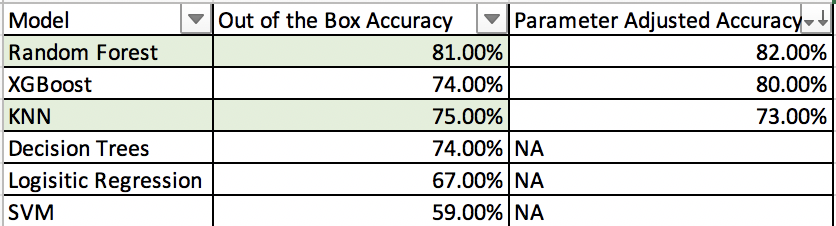

In [215]:
Image(filename='/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Scripts/acc2.png', width=500, 
      height=450) 

As we can see above, even after adjusting the parameters of our top 3 models; KNN, XGboost, and Random Forests, Random Forests still have the highest accuracy. Thus, we will continue exploring this model in more detail.

## Can we improve performance by ensembling our models?

One way to continue this exploration, given our prior work, is through model ensembling. 

Ensemble modeling is the process of running two or more related but different analytical models and then synthesizing the results into a single score or spread in order to improve the accuracy of predictive analytics and data mining applications. (https://searchbusinessanalytics.techtarget.com/definition/Ensemble-modeling) 

Essentially, an ensemble model works by training different models on a dataset and having each model make predictions individually. These inidvidual predictions are then combined in the final ensemble model to make a prediction about the dataset.

*"Evaluating the prediction of an ensemble typically requires more computation than evaluating the prediction of a single model, so ensembles may be thought of as a way to compensate for poor learning algorithms by performing a lot of extra computation... An ensemble is itself a supervised learning algorithm, because it can be trained and then used to make predictions. The trained ensemble, therefore, represents a single hypothesis. This hypothesis, however, is not necessarily contained within the hypothesis space of the models from which it is built. Thus, ensembles can be shown to have more flexibility in the functions they can represent. This flexibility can, in theory, enable them to over-fit the training data more than a single model would, but in practice, some ensemble techniques (especially bagging) tend to reduce problems related to over-fitting of the training data."*

"In general, it is not true that it will always perform better. There are several ensemble methods, each with its own advantages/weaknesses. Which one to use and then depends on the problem at hand.

For example, if you have models with high variance (they over-fit your data), then you are likely to benefit from using bagging. If you have biased models, it is better to combine them with Boosting. There are also different strategies to form ensembles. The topic is just too broad to cover it in one answer."

One helpful approach to finding the optimal combination of parameters for each model is through GridSearch. "Grid search works by training our model multiple times on a range of parameters that we specify. That way, we can test our model with each hyperparameter value and figure out the optimal values to get the best accuracy results."

Here, we will try a couple of methods: 
- **EnsembleVoteClassifier:** meta-classifier for combining similar or conceptually different machine learning classifiers for classification via majority or plurality voting. The EnsembleVoteClassifier implements "hard" and "soft" voting. In hard voting, we predict the final class label as the class label that has been predicted most frequently by the classification models. In soft voting, we predict the class labels by averaging the class-probabilities (only recommended if the classifiers are well-calibrated). *Here we used hard voting.*
- **Bayes Optimal Classifier:** The Bayes optimal classifier is a classification technique. It is an ensemble of all the hypotheses in the hypothesis space. The naive Bayes optimal classifier is a version of this that assumes that the data is conditionally independent on the class and makes the computation more feasible. Each hypothesis is given a vote proportional to the likelihood that the training dataset would be sampled from a system if that hypothesis were true. To facilitate training data of finite size, the vote of each hypothesis is also multiplied by the prior probability of that hypothesis. *This is to-do, I can't find an appropriate tutorial.*
- **Boostrap aggregating (Bagging):** This involves having each model in the ensemble vote with equal weight. In order to promote model variance, bagging trains each model in the ensemble using a randomly drawn subset of the training set. *Earlier, we used our random forest classifier to test this*. 
- **Boosting:** This involves incrementally building an ensemble by training each new model instance to emphasize the training instances that previous models mis-classified. *Earlier, we used XGboost to test this out, although another popular algorithm is Adaboost.* 
- **Stacking:** Stacking is an ensemble learning technique that uses predictions from multiple models (for example decision tree, knn or svm) to build a new model. This model is used for making predictions on the test set. *This did not work.* 
- **Mix and Match**: Another thing I want to try is to put together separate models for our categorical features and our non-categorical features. I think for the categorical features I'll use an RFC, and for the non-categorical features I'll use multi-class logistic regression. 




A couple of helpful resources are the following: 
- Ensemble modeling using scikit learn: https://towardsdatascience.com/ensemble-learning-using-scikit-learn-85c4531ff86a 
- Ensemble Vote Classifier: http://rasbt.github.io/mlxtend/user_guide/classifier/EnsembleVoteClassifier/ 
- Ensemble Learning Wiki: https://en.wikipedia.org/wiki/Ensemble_learning
- Comprehensive Guide to Ensemble Learning: https://www.analyticsvidhya.com/blog/2018/06/comprehensive-guide-for-ensemble-models/
- Scikit Learn Documentation: https://scikit-learn.org/stable/modules/ensemble.html
- Python Ensemble Methods: https://machinelearningmastery.com/ensemble-machine-learning-algorithms-python-scikit-learn/
- Datacampt article: https://www.datacamp.com/community/tutorials/ensemble-learning-python
- Comparison of Ensemble Models (paper): https://arxiv.org/pdf/1106.0257.pdf 



### Ensemble Voting

In [234]:
from sklearn.ensemble import VotingClassifier

print(knn)
print(rfc_peak)
print(grid_xgb)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')
RandomForestClassifier(bootstrap=False, class_weight=None, criterion='gini',
                       max_depth=None, max_features='sqrt', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=400,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rat

In [237]:
#create a dictionary of our top 3models
estimators=[('knn', knn), ('rf', rfc_peak), ('xgb', grid_xgb)]


In [239]:
#create our voting classifier, inputting our models
ensemble = VotingClassifier(estimators, voting='hard')

We will set the voting parameter to hard, which tells our classifier to make predicitons by majority vote.

In [240]:
#fit model to training data
ensemble.fit(X_train, y_train)

Fitting 3 folds for each of 54 candidates, totalling 162 fits
[CV] eta=0, max_depth=1, num_class=2 .................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .................. eta=0, max_depth=1, num_class=2, total=   3.4s
[CV] eta=0, max_depth=1, num_class=2 .................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.4s remaining:    0.0s


[CV] .................. eta=0, max_depth=1, num_class=2, total=   3.3s
[CV] eta=0, max_depth=1, num_class=2 .................................
[CV] .................. eta=0, max_depth=1, num_class=2, total=   3.5s
[CV] eta=0, max_depth=1, num_class=3 .................................
[CV] .................. eta=0, max_depth=1, num_class=3, total=   3.4s
[CV] eta=0, max_depth=1, num_class=3 .................................
[CV] .................. eta=0, max_depth=1, num_class=3, total=   3.3s
[CV] eta=0, max_depth=1, num_class=3 .................................
[CV] .................. eta=0, max_depth=1, num_class=3, total=   3.3s
[CV] eta=0, max_depth=1, num_class=4 .................................
[CV] .................. eta=0, max_depth=1, num_class=4, total=   3.4s
[CV] eta=0, max_depth=1, num_class=4 .................................
[CV] .................. eta=0, max_depth=1, num_class=4, total=   3.6s
[CV] eta=0, max_depth=1, num_class=4 .................................
[CV] .

[CV] .................. eta=0, max_depth=4, num_class=3, total=   6.5s
[CV] eta=0, max_depth=4, num_class=4 .................................
[CV] .................. eta=0, max_depth=4, num_class=4, total=   6.4s
[CV] eta=0, max_depth=4, num_class=4 .................................
[CV] .................. eta=0, max_depth=4, num_class=4, total=   6.8s
[CV] eta=0, max_depth=4, num_class=4 .................................
[CV] .................. eta=0, max_depth=4, num_class=4, total=   6.8s
[CV] eta=0, max_depth=4, num_class=5 .................................
[CV] .................. eta=0, max_depth=4, num_class=5, total=   6.8s
[CV] eta=0, max_depth=4, num_class=5 .................................
[CV] .................. eta=0, max_depth=4, num_class=5, total=   6.8s
[CV] eta=0, max_depth=4, num_class=5 .................................
[CV] .................. eta=0, max_depth=4, num_class=5, total=   6.8s
[CV] eta=0, max_depth=4, num_class=6 .................................
[CV] .

[CV] .................. eta=0, max_depth=7, num_class=5, total=   9.2s
[CV] eta=0, max_depth=7, num_class=5 .................................
[CV] .................. eta=0, max_depth=7, num_class=5, total=   9.4s
[CV] eta=0, max_depth=7, num_class=5 .................................
[CV] .................. eta=0, max_depth=7, num_class=5, total=   9.4s
[CV] eta=0, max_depth=7, num_class=6 .................................
[CV] .................. eta=0, max_depth=7, num_class=6, total=   9.2s
[CV] eta=0, max_depth=7, num_class=6 .................................
[CV] .................. eta=0, max_depth=7, num_class=6, total=   9.2s
[CV] eta=0, max_depth=7, num_class=6 .................................
[CV] .................. eta=0, max_depth=7, num_class=6, total=   9.2s
[CV] eta=0, max_depth=7, num_class=7 .................................
[CV] .................. eta=0, max_depth=7, num_class=7, total=   9.2s
[CV] eta=0, max_depth=7, num_class=7 .................................
[CV] .

[Parallel(n_jobs=1)]: Done 162 out of 162 | elapsed: 20.2min finished


VotingClassifier(estimators=[('knn',
                              KNeighborsClassifier(algorithm='auto',
                                                   leaf_size=30,
                                                   metric='minkowski',
                                                   metric_params=None,
                                                   n_jobs=None, n_neighbors=1,
                                                   p=2, weights='uniform')),
                             ('rf',
                              RandomForestClassifier(bootstrap=False,
                                                     class_weight=None,
                                                     criterion='gini',
                                                     max_depth=None,
                                                     max_features='sqrt',
                                                     max_leaf_nodes=None,
                                                     min_impurity

In [359]:
#test our model on the test data
ensemble.score(X_test, y_test)

0.8142857142857143

In [360]:
y_pred_en1 =  ensemble.predict(X_test)
print('Accuracy of ensemble method 1 on test set: {:.2f}'.format(ensemble.score(X_test, y_test)))

Accuracy of ensemble method 1 on test set: 0.81


<div class ="alert alert-block alert-danger"> 
    Weird that this performs worse than RF.
</div>

### AdaBoost

In [248]:
from sklearn.ensemble import AdaBoostClassifier


In [250]:
ada = AdaBoostClassifier(random_state=43)
ada.fit(X_train, y_train)



AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=43)

In [251]:
ada.score(X_test,y_test)

0.3514285714285714

### Gradient Boosting

In [253]:
from sklearn.ensemble import GradientBoostingClassifier
gbc= GradientBoostingClassifier(learning_rate=0.01,random_state=1)
gbc.fit(X_train, y_train)



GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.01, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='auto',
                           random_state=1, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [254]:
gbc.score(X_test,y_test)

0.6868571428571428

### Light GBM

In [256]:
import lightgbm as lgb


In [261]:
#define parameters
params = {'learning_rate':0.001}
train_data=lgb.Dataset(X_train,label=y_train)
lgmb = lgb.train(params, train_data, 100) 


In [264]:
y_pred=lgmb.predict(X_test)
for i in range(0,185):
    if y_pred[i]>=0.5: 
        y_pred[i]=1
    else: 
        y_pred[i]=0

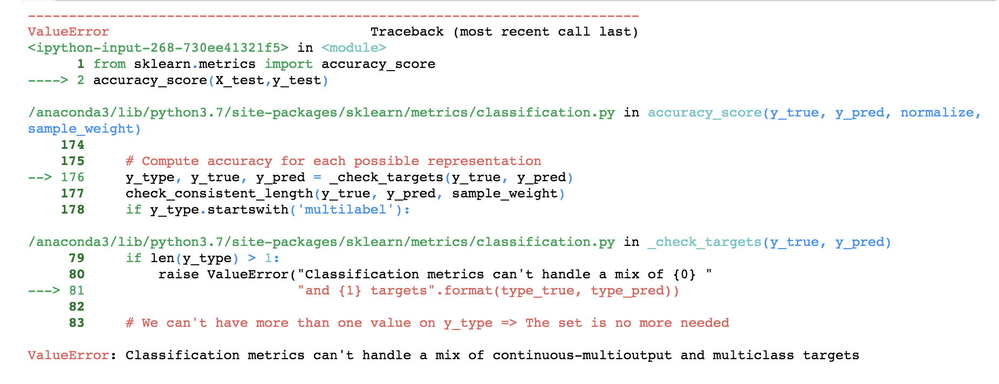

In [270]:
from sklearn.metrics import accuracy_score
#accuracy_score(X_test,y_test)

Image(filename='/Users/angelateng/Documents/GitHub/Projects/Covertype_Prediction/Scripts/error2.png', width=700, 
      height=450) 

### CATBoost

In [272]:
from catboost import CatBoostClassifier


In [273]:
cbc=CatBoostClassifier()

In [277]:
#categorical_features_indices = np.where(df.dtypes != np.float)[0]
#cbc.fit(X_train,y_train,cat_features=([ 0,  1, 2, 3, 4, 10]),eval_set=(X_test, y_test))
cbc.fit(X_train,y_train)

0:	learn: -1.8854095	total: 150ms	remaining: 2m 30s
1:	learn: -1.8306263	total: 226ms	remaining: 1m 52s
2:	learn: -1.7808308	total: 311ms	remaining: 1m 43s
3:	learn: -1.7439333	total: 410ms	remaining: 1m 42s
4:	learn: -1.7006922	total: 492ms	remaining: 1m 37s
5:	learn: -1.6631340	total: 564ms	remaining: 1m 33s
6:	learn: -1.6265643	total: 656ms	remaining: 1m 33s
7:	learn: -1.5943248	total: 738ms	remaining: 1m 31s
8:	learn: -1.5606032	total: 817ms	remaining: 1m 29s
9:	learn: -1.5301506	total: 906ms	remaining: 1m 29s
10:	learn: -1.5008222	total: 981ms	remaining: 1m 28s
11:	learn: -1.4735162	total: 1.07s	remaining: 1m 27s
12:	learn: -1.4460591	total: 1.16s	remaining: 1m 28s
13:	learn: -1.4206760	total: 1.24s	remaining: 1m 27s
14:	learn: -1.3994313	total: 1.31s	remaining: 1m 26s
15:	learn: -1.3767262	total: 1.42s	remaining: 1m 27s
16:	learn: -1.3550465	total: 1.52s	remaining: 1m 27s
17:	learn: -1.3340891	total: 1.6s	remaining: 1m 27s
18:	learn: -1.3166116	total: 1.7s	remaining: 1m 27s
19:	l

156:	learn: -0.6974352	total: 14s	remaining: 1m 14s
157:	learn: -0.6964627	total: 14.1s	remaining: 1m 14s
158:	learn: -0.6951945	total: 14.1s	remaining: 1m 14s
159:	learn: -0.6943406	total: 14.3s	remaining: 1m 14s
160:	learn: -0.6934670	total: 14.3s	remaining: 1m 14s
161:	learn: -0.6924711	total: 14.4s	remaining: 1m 14s
162:	learn: -0.6912550	total: 14.5s	remaining: 1m 14s
163:	learn: -0.6905186	total: 14.6s	remaining: 1m 14s
164:	learn: -0.6893484	total: 14.7s	remaining: 1m 14s
165:	learn: -0.6884205	total: 14.8s	remaining: 1m 14s
166:	learn: -0.6875152	total: 14.9s	remaining: 1m 14s
167:	learn: -0.6864607	total: 15s	remaining: 1m 14s
168:	learn: -0.6852985	total: 15.1s	remaining: 1m 14s
169:	learn: -0.6839018	total: 15.2s	remaining: 1m 14s
170:	learn: -0.6829296	total: 15.3s	remaining: 1m 14s
171:	learn: -0.6815366	total: 15.4s	remaining: 1m 14s
172:	learn: -0.6811302	total: 15.5s	remaining: 1m 13s
173:	learn: -0.6803965	total: 15.5s	remaining: 1m 13s
174:	learn: -0.6791322	total: 15

313:	learn: -0.5846278	total: 27.6s	remaining: 1m
314:	learn: -0.5839448	total: 27.7s	remaining: 1m
315:	learn: -0.5833425	total: 27.7s	remaining: 1m
316:	learn: -0.5830874	total: 27.8s	remaining: 59.9s
317:	learn: -0.5825045	total: 27.9s	remaining: 59.9s
318:	learn: -0.5822919	total: 28s	remaining: 59.8s
319:	learn: -0.5818400	total: 28.1s	remaining: 59.7s
320:	learn: -0.5811138	total: 28.2s	remaining: 59.6s
321:	learn: -0.5802916	total: 28.3s	remaining: 59.5s
322:	learn: -0.5799075	total: 28.3s	remaining: 59.4s
323:	learn: -0.5797165	total: 28.4s	remaining: 59.3s
324:	learn: -0.5791799	total: 28.5s	remaining: 59.2s
325:	learn: -0.5787123	total: 28.6s	remaining: 59.1s
326:	learn: -0.5781840	total: 28.7s	remaining: 59s
327:	learn: -0.5779971	total: 28.8s	remaining: 58.9s
328:	learn: -0.5775767	total: 28.9s	remaining: 58.9s
329:	learn: -0.5774935	total: 29s	remaining: 58.9s
330:	learn: -0.5768370	total: 29.1s	remaining: 58.8s
331:	learn: -0.5762272	total: 29.3s	remaining: 58.9s
332:	lea

470:	learn: -0.5181447	total: 41.5s	remaining: 46.6s
471:	learn: -0.5178997	total: 41.6s	remaining: 46.5s
472:	learn: -0.5176366	total: 41.7s	remaining: 46.4s
473:	learn: -0.5172222	total: 41.8s	remaining: 46.4s
474:	learn: -0.5166752	total: 41.9s	remaining: 46.3s
475:	learn: -0.5159914	total: 42s	remaining: 46.2s
476:	learn: -0.5157277	total: 42.1s	remaining: 46.1s
477:	learn: -0.5154376	total: 42.2s	remaining: 46.1s
478:	learn: -0.5152854	total: 42.3s	remaining: 46s
479:	learn: -0.5147212	total: 42.4s	remaining: 45.9s
480:	learn: -0.5145142	total: 42.5s	remaining: 45.9s
481:	learn: -0.5142864	total: 42.6s	remaining: 45.8s
482:	learn: -0.5141246	total: 42.7s	remaining: 45.7s
483:	learn: -0.5135713	total: 42.7s	remaining: 45.6s
484:	learn: -0.5130299	total: 42.8s	remaining: 45.5s
485:	learn: -0.5128163	total: 42.9s	remaining: 45.4s
486:	learn: -0.5126744	total: 43s	remaining: 45.3s
487:	learn: -0.5125992	total: 43.1s	remaining: 45.2s
488:	learn: -0.5122678	total: 43.2s	remaining: 45.1s

626:	learn: -0.4722879	total: 56s	remaining: 33.3s
627:	learn: -0.4721912	total: 56.1s	remaining: 33.2s
628:	learn: -0.4719067	total: 56.2s	remaining: 33.1s
629:	learn: -0.4715027	total: 56.3s	remaining: 33.1s
630:	learn: -0.4710592	total: 56.4s	remaining: 33s
631:	learn: -0.4708984	total: 56.5s	remaining: 32.9s
632:	learn: -0.4707481	total: 56.6s	remaining: 32.8s
633:	learn: -0.4705610	total: 56.7s	remaining: 32.7s
634:	learn: -0.4704267	total: 56.8s	remaining: 32.7s
635:	learn: -0.4701186	total: 56.9s	remaining: 32.6s
636:	learn: -0.4698496	total: 57s	remaining: 32.5s
637:	learn: -0.4696306	total: 57.1s	remaining: 32.4s
638:	learn: -0.4694198	total: 57.2s	remaining: 32.3s
639:	learn: -0.4691633	total: 57.3s	remaining: 32.2s
640:	learn: -0.4688529	total: 57.3s	remaining: 32.1s
641:	learn: -0.4686783	total: 57.4s	remaining: 32s
642:	learn: -0.4683338	total: 57.5s	remaining: 31.9s
643:	learn: -0.4680132	total: 57.6s	remaining: 31.8s
644:	learn: -0.4676570	total: 57.6s	remaining: 31.7s
6

784:	learn: -0.4337257	total: 1m 9s	remaining: 19s
785:	learn: -0.4336411	total: 1m 9s	remaining: 18.9s
786:	learn: -0.4333002	total: 1m 9s	remaining: 18.8s
787:	learn: -0.4330018	total: 1m 9s	remaining: 18.7s
788:	learn: -0.4328737	total: 1m 9s	remaining: 18.6s
789:	learn: -0.4325279	total: 1m 9s	remaining: 18.5s
790:	learn: -0.4322910	total: 1m 9s	remaining: 18.4s
791:	learn: -0.4320364	total: 1m 9s	remaining: 18.3s
792:	learn: -0.4316708	total: 1m 9s	remaining: 18.2s
793:	learn: -0.4315844	total: 1m 9s	remaining: 18.2s
794:	learn: -0.4313423	total: 1m 10s	remaining: 18.1s
795:	learn: -0.4310188	total: 1m 10s	remaining: 18s
796:	learn: -0.4309497	total: 1m 10s	remaining: 17.9s
797:	learn: -0.4305974	total: 1m 10s	remaining: 17.8s
798:	learn: -0.4305058	total: 1m 10s	remaining: 17.7s
799:	learn: -0.4304088	total: 1m 10s	remaining: 17.6s
800:	learn: -0.4302178	total: 1m 10s	remaining: 17.5s
801:	learn: -0.4300095	total: 1m 10s	remaining: 17.4s
802:	learn: -0.4297749	total: 1m 10s	remai

938:	learn: -0.4048173	total: 1m 25s	remaining: 5.54s
939:	learn: -0.4045772	total: 1m 25s	remaining: 5.45s
940:	learn: -0.4044695	total: 1m 25s	remaining: 5.35s
941:	learn: -0.4044025	total: 1m 25s	remaining: 5.26s
942:	learn: -0.4042015	total: 1m 25s	remaining: 5.17s
943:	learn: -0.4040430	total: 1m 25s	remaining: 5.08s
944:	learn: -0.4037323	total: 1m 25s	remaining: 4.99s
945:	learn: -0.4034522	total: 1m 25s	remaining: 4.9s
946:	learn: -0.4032832	total: 1m 25s	remaining: 4.81s
947:	learn: -0.4030863	total: 1m 26s	remaining: 4.72s
948:	learn: -0.4028911	total: 1m 26s	remaining: 4.63s
949:	learn: -0.4026262	total: 1m 26s	remaining: 4.54s
950:	learn: -0.4022951	total: 1m 26s	remaining: 4.45s
951:	learn: -0.4020184	total: 1m 26s	remaining: 4.36s
952:	learn: -0.4019039	total: 1m 26s	remaining: 4.27s
953:	learn: -0.4016997	total: 1m 26s	remaining: 4.18s
954:	learn: -0.4015058	total: 1m 26s	remaining: 4.09s
955:	learn: -0.4012698	total: 1m 26s	remaining: 4s
956:	learn: -0.4011826	total: 1m

In [278]:
cbc.score(X_test,y_test)

0.7885714285714286

### Blending

In [289]:
#combine rf + knn then do xgb

#model1 = tree.DecisionTreeClassifier()
#model1.fit(x_train, y_train)
#val_pred1=rfc_peak.predict(X_val)
test_pred1=rfc_peak.predict(X_test)
#val_pred1=pd.DataFrame(val_pred1)
test_pred1=pd.DataFrame(test_pred1)
#test_pred1

In [291]:
#model2 = KNeighborsClassifier()
#model2.fit(x_train,y_train)
#val_pred2=model2.predict(x_val)
test_pred2=knn.predict(X_test)
#val_pred2=pd.DataFrame(val_pred2)
test_pred2=pd.DataFrame(test_pred2)
#test_pred2

In [293]:
#df_val=pd.concat([x_val, val_pred1,val_pred2],axis=1)
#df_test=pd.concat([X_test, test_pred1,test_pred2],axis=1)
df_test=pd.concat([test_pred1,test_pred2],axis=1)

In [297]:
#df_val=pd.concat([x_val, val_pred1,val_pred2],axis=1)
#df_test=pd.concat([x_test, test_pred1,test_pred2],axis=1)

#xgb = LogisticRegression()
#grid_xgb.fit(df_val,y_val)
#grid_xgb.score(df_test,y_test)

#errors everywhere 

### Categorical Vs Non-Categorical

References for this approach: 
- https://www.kaggle.com/sociopath00/random-forest-using-gridsearchcv
- https://medium.com/@pushkarmandot/https-medium-com-pushkarmandot-what-is-lightgbm-how-to-implement-it-how-to-fine-tune-the-parameters-60347819b7fc
- https://towardsdatascience.com/an-introduction-to-t-sne-with-python-example-5a3a293108d1
- https://towardsdatascience.com/pca-using-python-scikit-learn-e653f8989e60

In [307]:
#get the original dataset and split the cols into categorical vs non-cat
pd.set_option('display.max_columns', None)
df_normalized_w_target.head()

,1,2,3,4,5,6,7,elevation,aspect,slope,horizontal_distance_to_hydrology,vertical_distance_to_hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area_1,Wilderness_Area_2,Wilderness_Area_3,Wilderness_Area_4,Soil_Type_1,Soil_Type_2,Soil_Type_3,Soil_Type_4,Soil_Type_5,Soil_Type_6,Soil_Type_7,Soil_Type_8,Soil_Type_9,Soil_Type_10,Soil_Type_11,Soil_Type_12,Soil_Type_13,Soil_Type_14,Soil_Type_15,Soil_Type_16,Soil_Type_17,Soil_Type_18,Soil_Type_19,Soil_Type_20,Soil_Type_21,Soil_Type_22,Soil_Type_23,Soil_Type_24,Soil_Type_25,Soil_Type_26,Soil_Type_27,Soil_Type_28,Soil_Type_29,Soil_Type_30,Soil_Type_31,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Soil_Type_40,Cover_Type
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.368684,0.141667,0.045455,0.184681,0.223514,0.071659,0.870079,0.913386,0.582677,0.875366,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.365683,0.155556,0.030303,0.151754,0.215762,0.054798,0.866142,0.925197,0.594488,0.867838,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.472736,0.386111,0.136364,0.191840,0.307494,0.446817,0.921260,0.937008,0.531496,0.853339,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.463232,0.430556,0.272727,0.173228,0.375969,0.434172,0.937008,0.937008,0.480315,0.865886,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.368184,0.125000,0.030303,0.109520,0.222222,0.054939,0.866142,0.921260,0.590551,0.860449,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5


In [33]:
cat_data = df_normalized_w_target[['Wilderness_Area_1','Wilderness_Area_2','Wilderness_Area_3','Wilderness_Area_4', 'Soil_Type_1', 'Soil_Type_2',
                                 'Soil_Type_3', 'Soil_Type_4', 'Soil_Type_5', 'Soil_Type_6', 'Soil_Type_7', 'Soil_Type_8', 'Soil_Type_9', 
                                 'Soil_Type_10', 'Soil_Type_11', 'Soil_Type_12', 'Soil_Type_13', 'Soil_Type_14',
                                'Soil_Type_15',
                                'Soil_Type_16',
                                'Soil_Type_17',
                                'Soil_Type_18',
                                'Soil_Type_19',
                                'Soil_Type_20',
                                'Soil_Type_21',
                                'Soil_Type_22',
                                'Soil_Type_23',
                                'Soil_Type_24',
                                'Soil_Type_25',
                                'Soil_Type_26',
                                'Soil_Type_27',
                                'Soil_Type_28',
                                'Soil_Type_29',
                                'Soil_Type_30',
                                'Soil_Type_31',
                                'Soil_Type_32',
                                'Soil_Type_33',
                                'Soil_Type_34',
                                'Soil_Type_35',
                                'Soil_Type_36',
                                'Soil_Type_37',
                                'Soil_Type_38',
                                'Soil_Type_39',
                                'Soil_Type_40', 
                                'Cover_Type']]

In [34]:
cat_data.head()
#num_cols = df_normalized_w_target._get_numeric_data().columns
#num_cols
#this doesnt work as even the binary variables are technically numeric

,Wilderness_Area_1,Wilderness_Area_2,Wilderness_Area_3,Wilderness_Area_4,Soil_Type_1,Soil_Type_2,Soil_Type_3,Soil_Type_4,Soil_Type_5,Soil_Type_6,...,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Soil_Type_40,Cover_Type
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5


In [35]:
non_cat_data = df_normalized_w_target[['elevation', 'aspect', 'slope', 'vertical_distance_to_hydrology', 
                                       'horizontal_distance_to_hydrology', 'Horizontal_Distance_To_Roadways', 
                                       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points', 
                                       'Cover_Type']]
non_cat_data.head()

,elevation,aspect,slope,vertical_distance_to_hydrology,horizontal_distance_to_hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Cover_Type
0,0.368684,0.141667,0.045455,0.223514,0.184681,0.071659,0.870079,0.913386,0.582677,0.875366,5
1,0.365683,0.155556,0.030303,0.215762,0.151754,0.054798,0.866142,0.925197,0.594488,0.867838,5
2,0.472736,0.386111,0.136364,0.307494,0.191840,0.446817,0.921260,0.937008,0.531496,0.853339,2
3,0.463232,0.430556,0.272727,0.375969,0.173228,0.434172,0.937008,0.937008,0.480315,0.865886,2
4,0.368184,0.125000,0.030303,0.222222,0.109520,0.054939,0.866142,0.921260,0.590551,0.860449,5


In [66]:
#define x and y 

# set target data  and x values for cat data
X_cat=cat_data[list(cat_data.columns)[0:-1]]
print(X_cat.shape)
X_cat.head()


(581012, 44)


,Wilderness_Area_1,Wilderness_Area_2,Wilderness_Area_3,Wilderness_Area_4,Soil_Type_1,Soil_Type_2,Soil_Type_3,Soil_Type_4,Soil_Type_5,Soil_Type_6,...,Soil_Type_31,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Soil_Type_40
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [67]:
Y_cat=cat_data[list(cat_data.columns)[-1]]
print(Y_cat.shape)
Y_cat.head()
#Y

(581012,)


0    5
1    5
2    2
3    2
4    5
Name: Cover_Type, dtype: int64

In [65]:
#sample the data, 1000 per output
X_cat, y_cat = make_imbalance(X_cat, Y_cat,
                      sampling_strategy={1: 1000, 2: 1000, 3: 1000, 4:1000, 5:1000, 6:1000, 7:1000},
                      random_state=RANDOM_STATE)
#X_cat, y_cat

In [72]:
#define x and y 

# set target data  and x values for noncat data
X_noncat=non_cat_data[list(non_cat_data.columns)[0:-1]]
print(X_noncat.shape)
X_noncat.head()


(581012, 10)


,elevation,aspect,slope,vertical_distance_to_hydrology,horizontal_distance_to_hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points
0,0.368684,0.141667,0.045455,0.223514,0.184681,0.071659,0.870079,0.913386,0.582677,0.875366
1,0.365683,0.155556,0.030303,0.215762,0.151754,0.054798,0.866142,0.925197,0.594488,0.867838
2,0.472736,0.386111,0.136364,0.307494,0.191840,0.446817,0.921260,0.937008,0.531496,0.853339
3,0.463232,0.430556,0.272727,0.375969,0.173228,0.434172,0.937008,0.937008,0.480315,0.865886
4,0.368184,0.125000,0.030303,0.222222,0.109520,0.054939,0.866142,0.921260,0.590551,0.860449


In [71]:
Y_noncat=non_cat_data[list(non_cat_data.columns)[-1]]
print(Y_noncat.shape)
Y_noncat.head()
#Y

(581012,)


0    5
1    5
2    2
3    2
4    5
Name: Cover_Type, dtype: int64

In [70]:
#sample the data, 1000 per output
X_noncat, y_noncat = make_imbalance(X_noncat, Y_noncat,
                      sampling_strategy={1: 1000, 2: 1000, 3: 1000, 4:1000, 5:1000, 6:1000, 7:1000},
                      random_state=RANDOM_STATE)
#X_noncat, y_noncat

In [42]:
#split into train and test
#split into training and testing
X_train_nc, X_test_nc, y_train_nc, y_test_nc = train_test_split(
    X_noncat, y_noncat, random_state=RANDOM_STATE)

In [43]:
#split into training and testing
X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(
    X_cat, y_cat, random_state=RANDOM_STATE)

#### Random Forest Classifier for Categorical Data 

In [344]:
rfc_c = RandomForestClassifier(n_estimators=400, min_samples_split= 2,
 min_samples_leaf= 1,
 max_features= 'sqrt',
 max_depth= None,
 bootstrap= False)

#using the parameters from the first search


In [345]:
rfc_c.fit(X_train_c, y_train_c)

RandomForestClassifier(bootstrap=False, class_weight=None, criterion='gini',
                       max_depth=None, max_features='sqrt', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=400,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [346]:
y_pred_c =  rfc_c.predict(X_test_c)

In [349]:
print('Accuracy of random forest classifier on categorical data test set: {:.2f}'.format(rfc_c.score(X_test_c, y_test_c)))

Accuracy of random forest classifier on categorical data test set: 0.59


In [350]:
rfc_c = RandomForestClassifier(n_estimators=100)

In [351]:
rfc_c.fit(X_train_c, y_train_c)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [352]:
y_pred_c =  rfc_c.predict(X_test_c)

In [353]:
print('Accuracy of tuned random forest classifier on categorical data test set: {:.2f}'.format(rfc_c.score(X_test_c, y_test_c)))

Accuracy of tunedrandom forest classifier on categorical data test set: 0.58


####  Logistic Regression for Non Categorical Variables

In [356]:
logreg_nc = LogisticRegression(random_state=42, solver='lbfgs', multi_class='multinomial').fit(X_train_nc, y_train_nc)
logreg_nc

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [357]:
y_pred_nc = logreg_nc.predict(X_test_nc)

In [358]:
print('Accuracy of logistic regression classifier on non-categorical test set: {:.2f}'.format(logreg_nc.score(X_test_nc, y_test_nc)))

Accuracy of logistic regression classifier on non-categorical test set: 0.61


In [364]:
#create a dictionary of our top 3models
estimators2=[('logreg', logreg_nc), ('rf', rfc_c)]

#create our voting classifier, inputting our models
ensemble2 = VotingClassifier(estimators2, voting='hard')


In [365]:
#fit model to training data
ensemble2.fit(X_train_nc, y_train_nc)

VotingClassifier(estimators=[('logreg',
                              LogisticRegression(C=1.0, class_weight=None,
                                                 dual=False, fit_intercept=True,
                                                 intercept_scaling=1,
                                                 l1_ratio=None, max_iter=100,
                                                 multi_class='multinomial',
                                                 n_jobs=None, penalty='l2',
                                                 random_state=42,
                                                 solver='lbfgs', tol=0.0001,
                                                 verbose=0, warm_start=False)),
                             ('rf',
                              RandomForestClassifier(bootstrap=True,
                                                     class_weight=None,
                                                     criterion='gini',
                                 

In [367]:
#test our model on the test data
ensemble2.score(X_test_nc, y_test_nc)

0.6977142857142857

In [368]:
#fit model to training data
ensemble2.fit(X_train_c, y_train_c)

VotingClassifier(estimators=[('logreg',
                              LogisticRegression(C=1.0, class_weight=None,
                                                 dual=False, fit_intercept=True,
                                                 intercept_scaling=1,
                                                 l1_ratio=None, max_iter=100,
                                                 multi_class='multinomial',
                                                 n_jobs=None, penalty='l2',
                                                 random_state=42,
                                                 solver='lbfgs', tol=0.0001,
                                                 verbose=0, warm_start=False)),
                             ('rf',
                              RandomForestClassifier(bootstrap=True,
                                                     class_weight=None,
                                                     criterion='gini',
                                 

In [370]:
#test our model on the test data
ensemble2.score(X_test_c, y_test_c)

0.588

<div class ="alert alert-block alert-danger"> 
   How should I define the Y var here? since the target stays the same but predictors change?
</div>

It seems like the random forest still performs best. Let's tryy a different approach to see if we can have additional gains by using feature engineering

#### Feature Engineering

Let's use PCA and tSNE to see if we can reduce the number of features here. 

##### PCA

In [44]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)


In [45]:
principalComponents = pca.fit_transform(X_noncat)


In [46]:
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])

In [47]:
finalDf = pd.concat([principalDf, Y_noncat], axis = 1)
finalDf.head()

,principal component 1,principal component 2,Cover_Type
0,-0.402795,0.087473,5
1,0.461559,0.007347,5
2,-0.305225,0.472427,2
3,-0.245113,0.200164,2
4,0.149486,0.307251,5


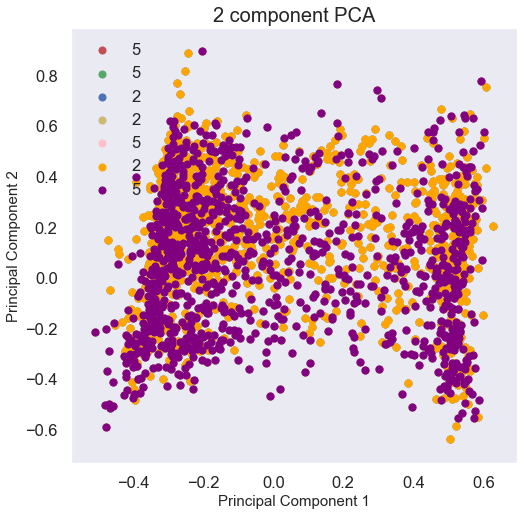

In [133]:
#visualize the 2D projection
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
#targets = ['Cover_Type']
#targets = finalDf['Cover_Type']
targets = finalDf['Cover_Type'].values
#targets = ['1', '2', '3', '4', '5', '6', '7']
#targets = ['1','2','3']
colors = ['r', 'g', 'b', 'y', 'pink', 'orange', 'purple']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['Cover_Type'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

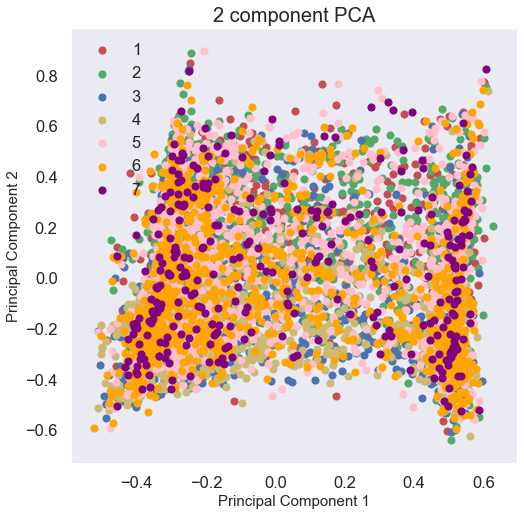

In [134]:
#visualize the 2D projection
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
#targets = ['Cover_Type']
#targets = finalDf['Cover_Type']
targets = np.unique(finalDf['Cover_Type'].values)
#targets = ['1', '2', '3', '4', '5', '6', '7']
#targets = ['1','2','3']
colors = ['r', 'g', 'b', 'y', 'pink', 'orange', 'purple']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['Cover_Type'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

In [49]:
pca.explained_variance_ratio_

array([0.40079652, 0.26357487])

In [50]:
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(X_noncat)
pca.explained_variance_ratio_

array([0.40079652, 0.26357487, 0.09387721])

In [51]:
pca = PCA(n_components=10)
principalComponents = pca.fit_transform(X_noncat)
pca.explained_variance_ratio_

array([4.00796516e-01, 2.63574875e-01, 9.38772062e-02, 7.52662934e-02,
       5.42118083e-02, 4.88567542e-02, 4.22127198e-02, 1.27839405e-02,
       8.28301691e-03, 1.36869530e-04])

Ler me try another way of implementing PCA to see if we get better results and to see if we can correctly color code t-SNE. 

In [74]:
df_noncat = pd.concat([X_noncat, Y_noncat], axis=1)
print(df_noncat.shape)
df_noncat.head()

#X_noncat --> array so taking this before sampling
#X_noncat
#Y_noncat

(581012, 11)


,elevation,aspect,slope,vertical_distance_to_hydrology,horizontal_distance_to_hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Cover_Type
0,0.368684,0.141667,0.045455,0.223514,0.184681,0.071659,0.870079,0.913386,0.582677,0.875366,5
1,0.365683,0.155556,0.030303,0.215762,0.151754,0.054798,0.866142,0.925197,0.594488,0.867838,5
2,0.472736,0.386111,0.136364,0.307494,0.191840,0.446817,0.921260,0.937008,0.531496,0.853339,2
3,0.463232,0.430556,0.272727,0.375969,0.173228,0.434172,0.937008,0.937008,0.480315,0.865886,2
4,0.368184,0.125000,0.030303,0.222222,0.109520,0.054939,0.866142,0.921260,0.590551,0.860449,5


In [75]:
pca = PCA(n_components=3)
#pca_result = pca.fit_transform(X_noncat.values)
#pca_result = pca.fit_transform(df_noncat[0:10])
#df_noncat.loc[0:8]

In [106]:
pca_result = pca.fit_transform(df_noncat[0:10])
pca_result

array([[-0.90817172,  0.02436204, -0.03758647],
       [-0.90920564,  0.04668819, -0.05612875],
       [ 2.126004  , -0.12506208, -0.0884399 ],
       [ 2.13453754, -0.19085443,  0.04763243],
       [-0.91196223,  0.04433574, -0.06171733],
       [ 2.0863004 ,  0.32094795,  0.04077859],
       [-0.90606303, -0.01796806,  0.02427277],
       [-0.9072625 ,  0.00542808, -0.02313546],
       [-0.90353272, -0.05764597,  0.06355989],
       [-0.90064409, -0.05023147,  0.09076424]])

In [109]:
#df_noncat['pca-one'] = pca_result[:,0]
pca_df = pd.DataFrame(columns = ['pca1','pca2','pca3'])

pca_df['pca1'] = pca_result[:,0]
pca_df['pca2'] = pca_result[:,1]
pca_df['pca3'] = pca_result[:,2]
#pca_df['pca4'] = pca_result[:,3]

pca_df

,pca1,pca2,pca3
0,-0.908172,0.024362,-0.037586
1,-0.909206,0.046688,-0.056129
2,2.126004,-0.125062,-0.088440
3,2.134538,-0.190854,0.047632
4,-0.911962,0.044336,-0.061717
5,2.086300,0.320948,0.040779
6,-0.906063,-0.017968,0.024273
7,-0.907262,0.005428,-0.023135
8,-0.903533,-0.057646,0.063560
9,-0.900644,-0.050231,0.090764


In [79]:
#X_noncat['pca-one'] = pca_result[:,0]
#X_noncat['pca-two'] = pca_result[:,1] 
#X_noncat['pca-three'] = pca_result[:,2]
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

Explained variation per principal component: [0.98910049 0.00855952 0.0017287 ]


In [122]:
#plt.figure(figsize=(16,10))
#sns.scatterplot(
    
    #hue="pca_result",
    #palette=sns.color_palette("hls"),
    #data=df_noncat[0:10]
    #legend="full"
#)


sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context("notebook", font_scale=1.5,
                rc={"lines.linewidth": 2.5})

# Utility function to visualize the outputs of PCA and t-SNE

def fashion_scatter(x, colors):
    # choose a color palette with seaborn.
    #num_classes = 7
    num_classes = len(np.unique(colors))
    palette = np.array(sns.color_palette("hls", num_classes))

    # create a scatter plot.
    f = plt.figure(figsize=(8, 8))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(x[:,0], x[:,1], lw=0, s=40)#, c=palette[colors.astype(np.int)])
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    ax.axis('off')
    ax.axis('tight')

    # add the labels for each digit corresponding to the label
    txts = []

    for i in range(num_classes):

        # Position of each label at median of data points.

        xtext, ytext = np.median(x[colors == i, :], axis=0)
        txt = ax.text(xtext, ytext, str(i), fontsize=24)
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=5, foreground="w"),
            PathEffects.Normal()])
        txts.append(txt)

    return f, ax, sc, txts

In [124]:
top_two_comp = pca_df[['pca1','pca2']] # taking first and second principal component

#fashion_scatter(top_two_comp.values,pca_df.values) # Visualizing the PCA output

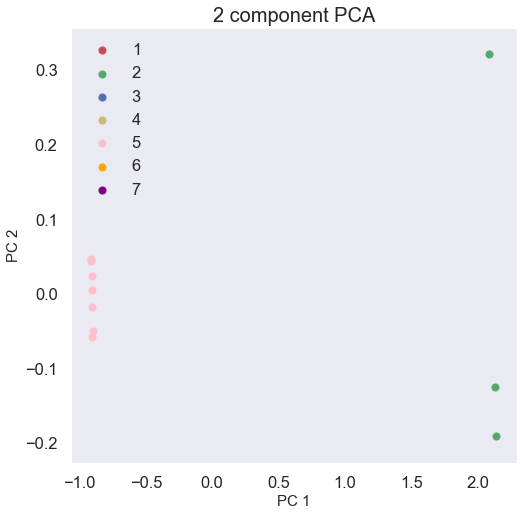

In [132]:
#visualize the 2D projection
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('PC 1', fontsize = 15)
ax.set_ylabel('PC 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
#targets = ['Cover_Type']
#targets = finalDf['Cover_Type']
targets = np.unique(finalDf['Cover_Type'].values)
#targets = ['1', '2', '3', '4', '5', '6', '7']
#targets = ['1','2','3']
colors = ['r', 'g', 'b', 'y', 'pink', 'orange', 'purple']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['Cover_Type'] == target
    ax.scatter(top_two_comp.loc[indicesToKeep, 'pca1']
               , top_two_comp.loc[indicesToKeep, 'pca2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

##### t-SNE
t-SNE differs from PCA by preserving only small pairwise distances or local similarities whereas PCA is concerned with preserving large pairwise distances to maximize variance. 

In [95]:
from sklearn.manifold import TSNE

#model initialization
tsne_50 = TSNE(n_components = 2, init = 'random', random_state = 10, perplexity = 50)

In [96]:
# trasforming principal components
tsne_df_50 = tsne_50.fit_transform(principalComponents)
tsne_df_50.shape

(7000, 2)

In [97]:
tsne_df_50

array([[-16.167698  ,  43.52125   ],
       [ -4.72167   , -53.218937  ],
       [-56.848137  ,  -0.18548839],
       ...,
       [-11.432671  , -57.671116  ],
       [-47.42411   ,   9.303071  ],
       [-32.63939   ,  21.423405  ]], dtype=float32)

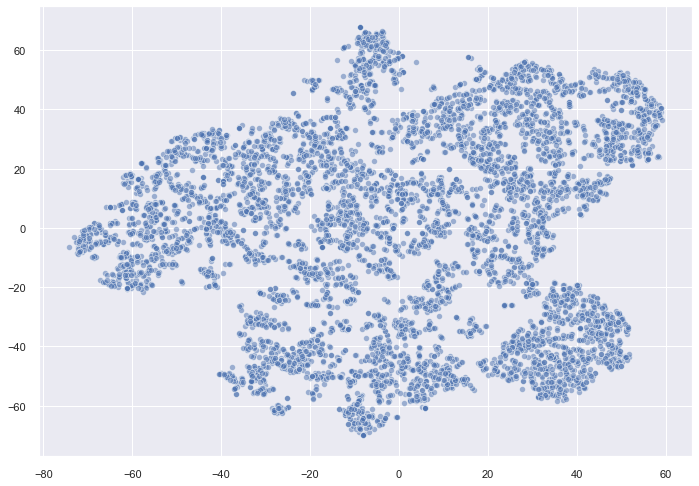

In [98]:
#using seaborn to visualize components
#sns.set_context("notebook", font_scale=1.1)
#sns.set_style("ticks")

sns.set()

fig, ax = plt.subplots(figsize = (11.7, 8.27))
scatter50 = sns.scatterplot(tsne_df_50[:, 0], tsne_df_50[:, 1], 
                            alpha = 0.5, legend='full')

In [166]:
#set scatterplot style
sns.set_context("notebook", font_scale=1.1)
sns.set_style("ticks")

#sns.lmplot(x='X_noncat', 
#          y = 'Y_noncat',
#           data=tsne_df_50,
 #         hue='Y_noncat')

In [169]:
tsne_df_50[:, 0]
tsne_df_50[:, 1]

array([ 43.52125   , -53.218937  ,  -0.18548839, ..., -57.671116  ,
         9.303071  ,  21.423405  ], dtype=float32)

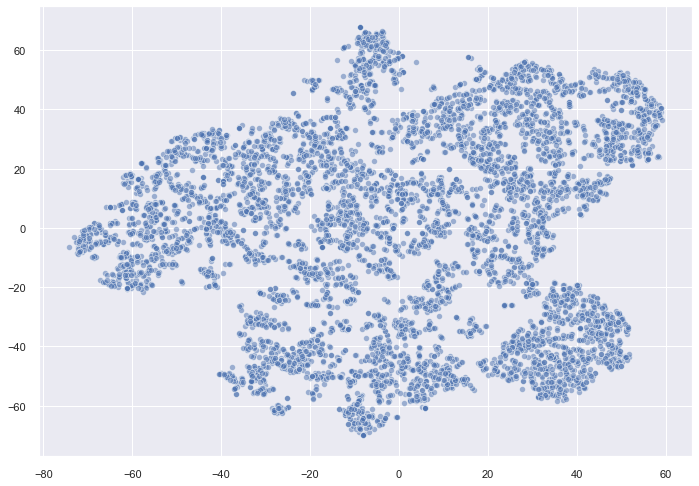

In [100]:
sns.set()

fig, ax = plt.subplots(figsize = (11.7, 8.27))
scatter50 = sns.scatterplot(tsne_df_50[:, 0], tsne_df_50[:, 1], 
                            alpha = 0.5, legend='brief')

In [101]:
tsne_50
#tsne_df_50[:, 0]
#tsne_df_50[:, 1]

TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
     method='barnes_hut', metric='euclidean', min_grad_norm=1e-07,
     n_components=2, n_iter=1000, n_iter_without_progress=300, perplexity=50,
     random_state=10, verbose=0)

In [137]:
#from sklearn.manifold import TSNE
import time
time_start = time.time()

fashion_tsne = TSNE(random_state=42).fit_transform(X_train_nc)
fashion_tsne
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))


t-SNE done! Time elapsed: 50.405847787857056 seconds


NameError: name 'PathEffects' is not defined

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


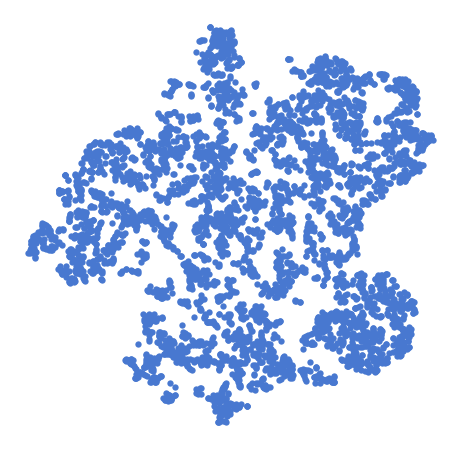

In [138]:
fashion_scatter(fashion_tsne, y_train_nc)

In [142]:
#reduce the number of dimensions first 
time_start = time.time()

pca_5 = PCA(n_components=5)
pca_result_5 = pca_5.fit_transform(X_train_nc)
pca_result_5
print('PCA with 5 components done! Time elapsed: {} seconds'.format(time.time()-time_start))

print('Cumulative variance explained by 5 principal components: {}'.format(np.sum(pca_5.explained_variance_ratio_)))

PCA with 5 components done! Time elapsed: 0.006770133972167969 seconds
Cumulative variance explained by 5 principal components: 0.8884902433088111


In [143]:
time_start = time.time()

fashion_pca_tsne = TSNE(random_state=42).fit_transform(pca_result_5)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

t-SNE done! Time elapsed: 46.49644494056702 seconds


NameError: name 'PathEffects' is not defined

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


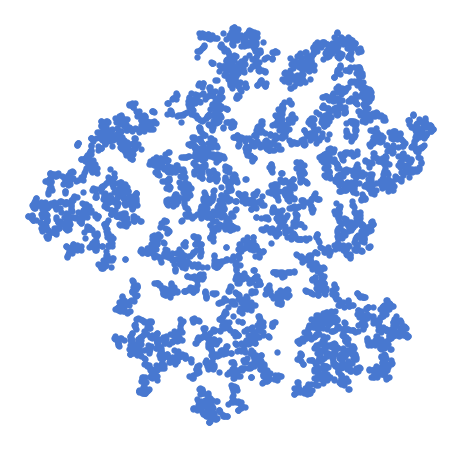

In [144]:
fashion_scatter(fashion_pca_tsne, y_train_nc)

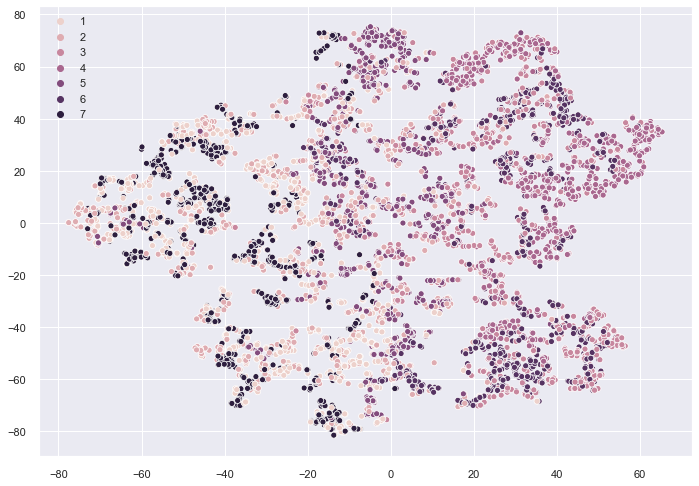

In [175]:
sns.set()

fig, ax = plt.subplots(figsize = (11.7, 8.27))
#scatter5 = sns.scatterplot( data=fashion_pca_tsne, x= fashion_pca_tsne, y =y_train_nc, hue=np.unique(y_train_nc) , legend='full')
scatter5 = sns.scatterplot( x= fashion_pca_tsne[:, 0], y = fashion_pca_tsne[:, 1], hue=y_train_nc, legend='full')




In [161]:
y_train_nc
fashion_pca_tsne
np.unique(y_train_nc)

array([1, 2, 3, 4, 5, 6, 7])

References: 
- https://www.datacamp.com/community/tutorials/introduction-t-sne


## Do my results make sense given my data exploration?

Yes, they do, and it also makes sense that the random forest would be the most predictive given that we have both continuous and categorical data. I think that the reason why the ensemble models didn't work as well as we hoped was because we might be overfitting/underfitting, depending on the model used.

## What kind of bias would I introduce in my model if I hadn’t subsampled each class equally?